In [395]:
import pandas as pd
import numpy as np
import matplotlib as plt
import statsmodels.api as sm
import plotly.express as px
from sklearn.preprocessing import StandardScaler
import datetime as dt
import matplotlib.pyplot as plt 
%matplotlib inline
plt.style.use('seaborn')

In [2]:
pd.set_option('display.max_rows', 1000)

In [3]:
prices = pd.read_csv(r"D:\EDHEC\Research Thesis\Data\Data to use\Daily_Price_data.csv")
mkt_cap = pd.read_csv(r"D:\EDHEC\Research Thesis\Data\Data to use\Daily_mkt_cap.csv")
high = pd.read_csv(r"D:\EDHEC\Research Thesis\Data\Data to use\Daily_High.csv")
volume = pd.read_csv(r"D:\EDHEC\Research Thesis\Data\Data to use\Daily_volume.csv")

### Calculating Log returns

In [4]:
def log_returns(data):
    data_log = np.log(data)
    data_log_diff = list(data_log.diff())
    return data_log_diff

In [5]:
prices[prices['Date'] == '1/1/2016']

,Date,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
978,1/1/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.005955,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
prices = prices[prices.index > 976]

In [7]:
prices = prices.set_index('Date')

In [8]:
tickers = mkt_cap.columns[1:]

In [9]:
log_returns_dataframe = pd.DataFrame(columns = tickers)
for tick in tickers:
    x = log_returns(prices[tick])
    log_returns_dataframe[tick] = x

C:\Users\DELL\anaconda3\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [10]:
log_returns_dataframe.index = prices.index

In [11]:
log_returns_dataframe.drop(['12/31/2015'], axis = 0, inplace = True)

In [12]:
log_returns_dataframe

,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,API3,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
Date,,,,,,,,,,,,,,,,,,,,,
1/1/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.014232,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/2/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.018252,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/3/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.007876,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/4/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.009919,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/5/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.014428,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12/27/2022,-0.014080,0.025281,-0.018746,-0.001300,-0.008953,-0.013282,-0.029544,-0.017355,-0.015512,-0.023069,...,-0.002706,0.006549,-0.030061,-0.046279,-0.031240,-0.003918,-0.040426,-0.023967,-0.026242,-0.022794
12/28/2022,-0.039846,-0.065224,-0.047154,-0.090064,-0.016215,-0.013841,-0.077374,0.029619,-0.018499,-0.018189,...,-0.000811,-0.032005,-0.046203,-0.014475,-0.036524,-0.051517,-0.033972,-0.031381,-0.051526,-0.042167
12/29/2022,-0.005680,0.014655,-0.017211,0.001783,-0.012576,-0.012246,-0.015056,0.002404,0.019941,-0.017109,...,-0.001941,-0.039138,-0.016664,0.013490,0.004464,-0.011258,0.015611,0.008003,-0.020042,-0.001518


### Calculating Weekly Log returns

In [13]:
weekly_log_returns = pd.DataFrame(columns = tickers)

In [14]:
log_returns_dataframe.fillna(0, inplace = True)

In [15]:
for tick in tickers:
    x = log_returns_dataframe[tick].rolling(window = 7, step = 7).sum().to_list()
    weekly_log_returns[tick] = x

In [16]:
mkt_cap[mkt_cap['Date'] == '1/1/2016']

,Date,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
978,1/1/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,199716460.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
mkt_cap['Date'][978]

'1/1/2016'

In [18]:
weekly_date = []
for i in range(978, 3535, 7):
    x = mkt_cap['Date'][i]
    weekly_date.append(x)

In [19]:
weekly_log_returns['Date'] = weekly_date

C:\Users\DELL\AppData\Local\Temp\ipykernel_16940\2952080894.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  weekly_log_returns['Date'] = weekly_date


In [20]:
weekly_log_returns = weekly_log_returns.set_index('Date')

In [21]:
weekly_log_returns.replace(0, np.nan, inplace = True)

In [22]:
weekly_log_returns

,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,API3,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
Date,,,,,,,,,,,,,,,,,,,,,
1/1/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/8/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.003654,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/15/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.126299,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/22/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.022229,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/29/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.290666,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2/5/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.059946,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2/12/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.094196,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2/19/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.032715,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2/26/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.022920,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Calculating Mkt Capitalization based portfolio returns

In [23]:
coin_market = pd.read_csv(r"D:\EDHEC\Research Thesis\Data\Data to use\Coin_mkt_price.csv")

In [24]:
coin_market['Log_Returns'] = log_returns(coin_market['Mkt_Price'])

In [25]:
coin_market = coin_market[coin_market.index < 3535]

In [26]:
coin_market = coin_market[coin_market.index > 977]

In [27]:
coin_market = coin_market.set_index('Date')

In [28]:
coin_market

,Total_mkt_cap,Mkt_Price,Log_Returns
Date,,,
1/1/2016,7.008589e+09,404.729084,0.009191
1/2/2016,6.998724e+09,403.725076,-0.002484
1/3/2016,6.947864e+09,400.373305,-0.008337
1/4/2016,6.994331e+09,403.551774,0.007907
1/5/2016,6.979466e+09,402.406085,-0.002843
...,...,...,...
12/27/2022,8.084290e+11,6999.861381,-0.014461
12/28/2022,7.978000e+11,6954.653595,-0.006479
12/29/2022,7.993090e+11,7003.132811,0.006947


### Calculating Coin Market weekly returns

In [29]:
weekly_coin_mkt_returns = pd.DataFrame()
x = coin_market['Log_Returns'].rolling(window = 7, step = 7).sum().to_list()
weekly_coin_mkt_returns['Coin_Mkt_Log_Returns'] = x

In [30]:
weekly_coin_mkt_returns.index = weekly_log_returns.index

In [31]:
weekly_coin_mkt_returns

,Coin_Mkt_Log_Returns
Date,
1/1/2016,NaN
1/8/2016,0.044649
1/15/2016,-0.228770
1/22/2016,0.046301
1/29/2016,-0.032112
2/5/2016,0.017584
2/12/2016,-0.044535
2/19/2016,0.108908
2/26/2016,0.017640


# Size Based Portfolios

### 1. Market Capitalization

In [32]:
mkt_cap = mkt_cap[mkt_cap.index > 970]

In [33]:
mkt_cap

,Date,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
971,12/25/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.175413e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
972,12/26/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.070551e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
973,12/27/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.127344e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
974,12/28/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.126344e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
975,12/29/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.100896e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3530,12/27/2022,312461656.6,808522712.0,8.985284e+09,58803067.14,1.213067e+09,132589379.8,159523270.6,89760611.85,84071357.20,...,347702047.0,1.853274e+10,711313529.6,54489433.54,170528725.0,201854629.4,620312358.8,120463283.6,272778747.9,135933446.3
3531,12/28/2022,300256564.8,757470436.4,8.571407e+09,53738507.36,1.193556e+09,130766790.9,147645772.6,92459020.45,82530385.70,...,347447482.6,1.794900e+10,679363192.4,53706380.47,164412734.9,191719022.9,599861877.9,116773579.6,259079409.5,130320664.7
3532,12/29/2022,298573388.9,768652796.3,8.425105e+09,53881401.49,1.178831e+09,129175113.1,145439416.6,92681598.84,84192662.38,...,346801453.8,1.726008e+10,668181980.8,54435783.31,165148355.3,189572795.1,609574187.7,117743720.2,253938530.9,130122977.0
3533,12/30/2022,294227767.1,740124296.7,8.475819e+09,53000189.36,1.206366e+09,128787228.1,147415108.1,91653486.40,83551508.68,...,348198224.6,1.736935e+10,666125264.8,56284320.53,162377384.8,187945707.9,607159790.8,119108232.7,252117870.5,125526973.8


In [34]:
mkt_cap.fillna(0, inplace = True)

In [35]:
weekly_mkt_cap = pd.DataFrame(columns = tickers)

In [36]:
for tick in tickers:
    x = mkt_cap[tick].rolling(window = 7, step = 7).max().to_list()
    weekly_mkt_cap[tick] = x

In [37]:
weekly_mkt_cap.drop([0], axis = 0, inplace = True)

In [38]:
weekly_mkt_cap.index = weekly_coin_mkt_returns.index

In [39]:
weekly_mkt_cap.replace(0, np.nan, inplace = True)

In [40]:
weekly_mkt_cap

,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,API3,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
Date,,,,,,,,,,,,,,,,,,,,,
1/1/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.127344e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/8/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.033952e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/15/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.006216e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/22/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.804606e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/29/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.319984e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2/5/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.463310e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2/12/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.828312e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2/19/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.942258e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2/26/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.813381e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [41]:
df = weekly_mkt_cap.transpose()

In [42]:
df = df.rank(pct = True)

In [43]:
df

Date,1/1/2016,1/8/2016,1/15/2016,1/22/2016,1/29/2016,2/5/2016,2/12/2016,2/19/2016,2/26/2016,3/4/2016,...,10/28/2022,11/4/2022,11/11/2022,11/18/2022,11/25/2022,12/2/2022,12/9/2022,12/16/2022,12/23/2022,12/30/2022
1INCH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.565611,0.565611,0.565611,0.579186,0.599099,0.605381,0.616071,0.604444,0.608889,0.613333
AAVE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.796380,0.805430,0.800905,0.764706,0.765766,0.780269,0.776786,0.777778,0.791111,0.795556
ADA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.968326,0.963801,0.963801,0.963801,0.963964,0.964126,0.964286,0.964444,0.964444,0.964444
AGIX,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.045249,0.031674,0.049774,0.036199,0.040541,0.022422,0.035714,0.040000,0.031111,0.044444
ALGO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.864253,0.873303,0.877828,0.877828,0.873874,0.874439,0.870536,0.875556,0.871111,0.862222
AMP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.371041,0.361991,0.352941,0.371041,0.351351,0.331839,0.316964,0.315556,0.377778,0.355556
ANKR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.475113,0.470588,0.461538,0.457014,0.472973,0.461883,0.441964,0.444444,0.417778,0.413333
ANT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.063348,0.067873,0.063348,0.176471,0.162162,0.116592,0.156250,0.155556,0.142222,0.182222
ANY,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.113122,0.076923,0.085973,0.067873,0.085586,0.125561,0.093750,0.088889,0.115556,0.142222
API3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.131222,0.199095,0.180995,0.149321,0.148649,0.147982,0.107143,0.111111,0.133333,0.146667


In [44]:
def portfolio_formation(df_ranked):
    portfolio1 = []
    portfolio2 = []
    portfolio3 = []
    portfolio4 = []
    portfolio5 = []
    dates = df_ranked.columns
    for date in dates:
        a = df_ranked[(df_ranked[date] > 0) & (df_ranked[date] <= 0.2)][date].index.to_list()
        b = df_ranked[(df_ranked[date] > 0.2) & (df_ranked[date] <= 0.4)][date].index.to_list()
        c = df_ranked[(df_ranked[date] > 0.4) & (df_ranked[date] <= 0.6)][date].index.to_list()
        d = df_ranked[(df_ranked[date] > 0.6) & (df_ranked[date] <= 0.8)][date].index.to_list()
        e = df_ranked[(df_ranked[date] > 0.8) & (df_ranked[date] <= 1)][date].index.to_list()
        portfolio1.append(a)
        portfolio2.append(b)
        portfolio3.append(c)
        portfolio4.append(d)
        portfolio5.append(e)
    df_portfolio = pd.DataFrame({'Portfolio_1' : portfolio1, 'Portfolio_2' : portfolio2, 'Portfolio_3' : portfolio3, 'Portfolio_4' : portfolio4, 'Portfolio_5' : portfolio5})
    df_portfolio.index = dates
    return df_portfolio

In [45]:
mkt_cap_portfolio = portfolio_formation(df)

In [46]:
mkt_cap_portfolio.index = weekly_mkt_cap.index

In [47]:
mkt_cap_portfolio

,Portfolio_1,Portfolio_2,Portfolio_3,Portfolio_4,Portfolio_5
Date,,,,,
1/1/2016,"[SC, SYS]","[DGB, USDT, XEM]","[XLM, XMR]","[DASH, DOGE, ETH]","[BTC, LTC, XRP]"
1/8/2016,"[SC, SYS]","[DGB, USDT, XEM]","[XLM, XMR]","[DASH, DOGE, ETH]","[BTC, LTC, XRP]"
1/15/2016,"[SC, SYS]","[DGB, USDT, XEM]","[XLM, XMR]","[DASH, DOGE, ETH]","[BTC, LTC, XRP]"
1/22/2016,"[SC, SYS]","[DGB, USDT, XEM]","[XLM, XMR]","[DASH, DOGE, ETH]","[BTC, LTC, XRP]"
1/29/2016,"[SC, SYS]","[DGB, USDT, XEM]","[XLM, XMR]","[DASH, DOGE, LTC]","[BTC, ETH, XRP]"
2/5/2016,"[SC, SYS]","[DGB, USDT, XMR]","[XEM, XLM]","[DASH, DOGE, LTC]","[BTC, ETH, XRP]"
2/12/2016,"[SC, SYS]","[DGB, USDT, XEM]","[XLM, XMR]","[DASH, DOGE, LTC]","[BTC, ETH, XRP]"
2/19/2016,"[SC, SYS]","[DGB, USDT, XEM]","[XLM, XMR]","[DASH, DOGE, LTC]","[BTC, ETH, XRP]"
2/26/2016,"[DGB, SC]","[DCR, SYS, USDT]","[XEM, XLM, XMR]","[DASH, DOGE, LTC]","[BTC, ETH, XRP]"


In [48]:
def portfolio_returns(df_portfolio, weekly_log_returns):
    portfolios = df_portfolio.columns
    dates = df_portfolio.index
    temp_dates = dates[:-1]
    weekly_log_returns.fillna(0, inplace = True)
    z = []
    for portfolio in portfolios:
        y = []
        j = 1
        for date in temp_dates:
            list_temp = df_portfolio.loc[date, portfolio]
            x = []
            for i in list_temp:
                ret = weekly_log_returns.loc[dates[j], i]
                x.append(ret)
            y.append(np.mean(x))
            j += 1
        z.append(y)
    portfolio_log_mkt_cap = pd.DataFrame({'1st_quantile': z[0], '2nd_quantile':z[1], '3rd_quantile':z[2], '4th_quantile':z[3], '5th_quantile':z[4]})
    portfolio_log_mkt_cap.index = dates[1:]
    return portfolio_log_mkt_cap
    

In [49]:
portfolio_mkt_cap = portfolio_returns(mkt_cap_portfolio, weekly_log_returns)

In [50]:
portfolio_mkt_cap

,1st_quantile,2nd_quantile,3rd_quantile,4th_quantile,5th_quantile
Date,,,,,
1/8/2016,0.060137,0.186570,-0.029050,0.014485,0.018619
1/15/2016,-0.050147,-0.040380,-0.049092,0.052736,-0.173117
1/22/2016,0.071294,0.229053,0.103148,0.253731,0.017564
1/29/2016,0.304422,0.083270,0.033469,0.328198,0.097999
2/5/2016,0.042389,0.058624,-0.036073,-0.017632,0.031971
2/12/2016,0.724663,0.311410,0.105513,-0.048149,0.289917
2/19/2016,0.517469,-0.171679,0.092842,-0.015291,-0.011384
2/26/2016,0.091870,0.040078,-0.044741,0.012156,0.075587
3/4/2016,0.080425,-0.166927,0.090843,0.007333,0.172716


In [51]:
long_short = pd.DataFrame()

In [52]:
long_short['Mkt_Cap'] = portfolio_mkt_cap['5th_quantile'] - portfolio_mkt_cap['1st_quantile']

In [53]:
long_short

,Mkt_Cap
Date,
1/8/2016,-0.041518
1/15/2016,-0.122970
1/22/2016,-0.053730
1/29/2016,-0.206424
2/5/2016,-0.010418
2/12/2016,-0.434746
2/19/2016,-0.528853
2/26/2016,-0.016283
3/4/2016,0.092291


In [54]:
long_short_2 = pd.DataFrame()
long_short_2['Mkt_Cap'] = portfolio_mkt_cap['1st_quantile'] - portfolio_mkt_cap['5th_quantile']

### 2. Volume

In [55]:
volume = volume[volume.index > 970]

In [56]:
volume = volume.set_index('Date')

In [57]:
volume

,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,API3,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
Date,,,,,,,,,,,,,,,,,,,,,
12/25/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,815998.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12/26/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,665210.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12/27/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,465856.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12/28/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,469583.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12/29/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,312612.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12/27/2022,14249300.25,49640031.72,164331309.0,1545483.96,28856494.23,2687836.76,14002273.09,9984175.46,1506.94,3022577.29,...,228599.08,905248563.4,12514171.33,2063181.03,824713.39,14511724.97,35383850.93,5816289.86,14374733.29,6567619.08
12/28/2022,16650737.58,47399222.04,209596268.9,2183181.32,46172647.08,4956866.54,14056114.19,13304290.26,4100.63,4855561.12,...,437762.65,839617675.9,15960079.05,1415615.07,1014621.12,19321079.07,40210321.49,5553285.52,16144153.63,7655516.15
12/29/2022,14793779.79,40802574.99,214425738.5,1047214.71,40661271.76,2670039.05,13937610.11,11170163.02,10739.13,3131976.55,...,323592.03,898022518.4,12892516.99,1431054.07,1386846.16,14943943.57,38553000.57,4138555.48,15359652.94,8756790.56


In [58]:
weekly_volume = pd.DataFrame(columns = tickers)

In [59]:
for tick in tickers:
    x = volume[tick].rolling(window = 7, step = 7).max().to_list()
    weekly_volume[tick] = x

In [60]:
weekly_volume.drop([0], axis = 0, inplace = True)

In [61]:
weekly_volume.index = weekly_mkt_cap.index

In [62]:
df = weekly_volume.transpose()

In [63]:
df = df.rank(pct = True)

In [64]:
df

Date,1/1/2016,1/8/2016,1/15/2016,1/22/2016,1/29/2016,2/5/2016,2/12/2016,2/19/2016,2/26/2016,3/4/2016,...,10/28/2022,11/4/2022,11/11/2022,11/18/2022,11/25/2022,12/2/2022,12/9/2022,12/16/2022,12/23/2022,12/30/2022
1INCH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.623894,0.597345,0.682819,0.740088,0.621145,0.740088,0.671053,0.578947,0.627193,0.631579
AAVE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.823009,0.831858,0.819383,0.845815,0.898678,0.819383,0.754386,0.785088,0.798246,0.833333
ADA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.964602,0.946903,0.933921,0.929515,0.925110,0.925110,0.921053,0.951754,0.956140,0.947368
AGIX,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.287611,0.137168,0.431718,0.096916,0.405286,0.061674,0.653509,0.622807,0.377193,0.271930
ALGO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.814159,0.867257,0.907489,0.881057,0.916300,0.766520,0.776316,0.815789,0.820175,0.798246
AMP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.247788,0.349558,0.246696,0.229075,0.215859,0.215859,0.175439,0.337719,0.692982,0.491228
ANKR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.522124,0.637168,0.546256,0.744493,0.810573,0.713656,0.513158,0.500000,0.517544,0.679825
ANT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.353982,0.570796,0.541850,0.466960,0.524229,0.396476,0.855263,0.526316,0.535088,0.570175
ANY,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.026549,0.022124,0.017621,0.039648,0.048458,0.008811,0.008772,0.008772,0.004386,0.004386
API3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.402655,0.699115,0.400881,0.312775,0.273128,0.511013,0.337719,0.267544,0.263158,0.390351


In [65]:
volume_portfolio = portfolio_formation(df)

In [66]:
volume_portfolio

,Portfolio_1,Portfolio_2,Portfolio_3,Portfolio_4,Portfolio_5
Date,,,,,
1/1/2016,"[SC, SYS]","[DGB, XEM, XLM]","[USDT, XMR]","[DASH, DOGE, ETH]","[BTC, LTC, XRP]"
1/8/2016,"[DGB, SYS]","[XEM, XLM]","[DASH, DOGE, XMR]","[USDT, XRP]","[BTC, ETH, LTC]"
1/15/2016,"[SC, SYS]","[DGB, XEM, XMR]","[USDT, XLM]","[DASH, DOGE, XRP]","[BTC, ETH, LTC]"
1/22/2016,"[SC, SYS]","[DGB, XLM, XMR]","[USDT, XEM]","[DASH, DOGE, XRP]","[BTC, ETH, LTC]"
1/29/2016,"[SC, SYS]","[DGB, USDT, XEM]","[XLM, XMR]","[DASH, DOGE, XRP]","[BTC, ETH, LTC]"
2/5/2016,"[SC, SYS]","[DGB, XLM, XMR]","[DASH, XEM]","[DOGE, USDT, XRP]","[BTC, ETH, LTC]"
2/12/2016,"[SYS, XEM]","[DASH, DGB, XMR]","[DOGE, USDT]","[LTC, SC, XLM]","[BTC, ETH, XRP]"
2/19/2016,"[DCR, XEM]","[DGB, SYS, XLM]","[DASH, SC, USDT]","[DOGE, XMR, XRP]","[BTC, ETH, LTC]"
2/26/2016,"[DGB, SC]","[DCR, XEM, XLM]","[DASH, DOGE, XMR]","[SYS, USDT, XRP]","[BTC, ETH, LTC]"


In [67]:
portfolio_volume = portfolio_returns(volume_portfolio, weekly_log_returns)

In [68]:
portfolio_volume

,1st_quantile,2nd_quantile,3rd_quantile,4th_quantile,5th_quantile
Date,,,,,
1/8/2016,0.060137,0.173591,-0.009582,0.014485,0.018619
1/15/2016,-0.175835,-0.013771,-0.058348,-0.063150,-0.063592
1/22/2016,0.071294,0.304296,-0.009717,0.173875,0.097420
1/29/2016,0.304422,0.119408,-0.020738,0.255766,0.170430
2/5/2016,0.042389,0.058624,-0.036073,-0.000427,0.014766
2/12/2016,0.724663,0.393209,-0.077388,0.026107,0.255794
2/19/2016,0.545633,-0.075259,-0.006455,-0.064289,-0.011384
2/26/2016,0.326065,0.055651,0.014490,-0.054964,0.099623
3/4/2016,0.080425,-0.121069,0.124323,-0.053774,0.154485


In [69]:
long_short['Volume'] = portfolio_volume['5th_quantile'] - portfolio_volume['1st_quantile']

In [70]:
long_short

,Mkt_Cap,Volume
Date,,
1/8/2016,-0.041518,-0.041518
1/15/2016,-0.122970,0.112242
1/22/2016,-0.053730,0.026126
1/29/2016,-0.206424,-0.133992
2/5/2016,-0.010418,-0.027623
2/12/2016,-0.434746,-0.468869
2/19/2016,-0.528853,-0.557017
2/26/2016,-0.016283,-0.226441
3/4/2016,0.092291,0.074060


In [71]:
long_short_2['Volume'] = portfolio_volume['1st_quantile'] - portfolio_volume['5th_quantile']

### 3. Price day high

In [72]:
high = high[high.index > 970]

In [73]:
high = high.set_index('Date')

In [74]:
high

,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,API3,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
Date,,,,,,,,,,,,,,,,,,,,,
12/25/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.006514,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12/26/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.006508,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12/27/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.006355,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12/28/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.006442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12/29/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.006353,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12/27/2022,0.408973,58.086635,0.265969,0.052537,0.172024,0.003184,0.017234,2.232080,4.607914,1.211355,...,0.034818,0.372270,0.796636,4.002962,0.031544,5555.510734,40.439666,9.398013,0.017707,0.164901
12/28/2022,0.401318,57.655777,0.260842,0.051688,0.170297,0.003272,0.016538,2.266029,4.530145,1.195837,...,0.034701,0.368543,0.773955,3.850660,0.030597,5519.947567,38.945630,9.223672,0.017258,0.161118
12/29/2022,0.386448,54.866743,0.248460,0.047604,0.167626,0.003118,0.015356,2.236852,4.625870,1.171805,...,0.034676,0.357225,0.742638,3.814649,0.030133,5257.579926,38.309269,8.996261,0.016416,0.157233


In [75]:
weekly_high = pd.DataFrame(columns = tickers)

In [76]:
for tick in tickers:
    x = high[tick].rolling(window = 7, step = 7).max().to_list()
    weekly_high[tick] = x

In [77]:
weekly_high.drop([0], axis = 0, inplace = True)

In [78]:
weekly_high.index = weekly_mkt_cap.index

In [79]:
df = weekly_high.transpose()

In [80]:
df = df.rank(pct = True)

In [81]:
high_portfolio = portfolio_formation(df)

In [82]:
high_portfolio

,Portfolio_1,Portfolio_2,Portfolio_3,Portfolio_4,Portfolio_5
Date,,,,,
1/1/2016,"[DOGE, SC]","[DGB, SYS, XEM]","[XLM, XRP]","[ETH, USDT, XMR]","[BTC, DASH, LTC]"
1/8/2016,"[DGB, DOGE]","[SYS, XEM]","[XLM, XMR, XRP]","[ETH, USDT]","[BTC, DASH, LTC]"
1/15/2016,"[DOGE, SC]","[DGB, SYS, XEM]","[XLM, XRP]","[ETH, USDT, XMR]","[BTC, DASH, LTC]"
1/22/2016,"[DOGE, SC]","[DGB, SYS, XEM]","[XLM, XRP]","[ETH, USDT, XMR]","[BTC, DASH, LTC]"
1/29/2016,"[DGB, SC]","[DOGE, SYS, XEM]","[XLM, XRP]","[ETH, USDT, XMR]","[BTC, DASH, LTC]"
2/5/2016,"[DGB, SC]","[DOGE, SYS, XEM]","[XLM, XRP]","[ETH, USDT, XMR]","[BTC, DASH, LTC]"
2/12/2016,"[DOGE, SC]","[DGB, SYS, XEM]","[XLM, XRP]","[LTC, USDT, XMR]","[BTC, DASH, ETH]"
2/19/2016,"[DOGE, SC]","[DGB, XEM, XLM]","[SYS, USDT, XRP]","[DCR, LTC, XMR]","[BTC, DASH, ETH]"
2/26/2016,"[DGB, SC]","[DOGE, XEM, XLM]","[SYS, XMR, XRP]","[DCR, LTC, USDT]","[BTC, DASH, ETH]"


In [83]:
portfolio_high = portfolio_returns(high_portfolio, weekly_log_returns)

In [84]:
portfolio_high

,1st_quantile,2nd_quantile,3rd_quantile,4th_quantile,5th_quantile
Date,,,,,
1/8/2016,0.035070,0.211593,-0.021295,0.006971,0.012653
1/15/2016,-0.060176,-0.175603,-0.074828,0.101137,-0.125855
1/22/2016,0.082599,0.261675,-0.020867,0.147736,0.166076
1/29/2016,0.457451,0.191813,0.196568,0.157446,-0.050545
2/5/2016,-0.093390,0.137443,0.015486,-0.008552,0.000219
2/12/2016,0.929300,0.088149,0.169798,0.330583,-0.044836
2/19/2016,-0.072552,0.217365,-0.036123,0.111644,-0.048040
2/26/2016,-0.107148,0.012494,0.079958,0.187089,0.124068
3/4/2016,0.080425,-0.037356,0.046557,-0.128239,0.223003


In [85]:
long_short['Price_High'] = portfolio_high['5th_quantile'] - portfolio_high['1st_quantile']

In [86]:
long_short

,Mkt_Cap,Volume,Price_High
Date,,,
1/8/2016,-0.041518,-0.041518,-0.022417
1/15/2016,-0.122970,0.112242,-0.065679
1/22/2016,-0.053730,0.026126,0.083477
1/29/2016,-0.206424,-0.133992,-0.507996
2/5/2016,-0.010418,-0.027623,0.093609
2/12/2016,-0.434746,-0.468869,-0.974135
2/19/2016,-0.528853,-0.557017,0.024513
2/26/2016,-0.016283,-0.226441,0.231216
3/4/2016,0.092291,0.074060,0.142577


In [87]:
long_short_2['Price_High'] = portfolio_high['1st_quantile'] - portfolio_high['5th_quantile']

# Momentum based portfolios

### 1 week momentum

In [88]:
prices = pd.read_csv(r"D:\EDHEC\Research Thesis\Data\Data to use\Daily_Price_data.csv")

In [89]:
prices = prices.set_index('Date')

In [90]:
log_returns_df = pd.DataFrame(columns = tickers)

In [91]:
for tick in tickers:
    x = log_returns(prices[tick])
    log_returns_df[tick] = x 

C:\Users\DELL\anaconda3\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [92]:
log_returns_df.index = prices.index

In [93]:
log_returns_df.fillna(0, inplace = True)

In [94]:
log_returns_df

,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,API3,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
Date,,,,,,,,,,,,,,,,,,,,,
4/28/2013,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4/29/2013,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4/30/2013,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5/1/2013,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5/2/2013,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12/27/2022,-0.014080,0.025281,-0.018746,-0.001300,-0.008953,-0.013282,-0.029544,-0.017355,-0.015512,-0.023069,...,-0.002706,0.006549,-0.030061,-0.046279,-0.031240,-0.003918,-0.040426,-0.023967,-0.026242,-0.022794
12/28/2022,-0.039846,-0.065224,-0.047154,-0.090064,-0.016215,-0.013841,-0.077374,0.029619,-0.018499,-0.018189,...,-0.000811,-0.032005,-0.046203,-0.014475,-0.036524,-0.051517,-0.033972,-0.031381,-0.051526,-0.042167
12/29/2022,-0.005680,0.014655,-0.017211,0.001783,-0.012576,-0.012246,-0.015056,0.002404,0.019941,-0.017109,...,-0.001941,-0.039138,-0.016664,0.013490,0.004464,-0.011258,0.015611,0.008003,-0.020042,-0.001518


In [95]:
data = log_returns_df.reset_index()

In [96]:
data = data[data.index > 970]

In [97]:
data.replace(0, np.nan, inplace = True)

In [98]:
data

,Date,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
971,12/25/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.082865,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
972,12/26/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.049404,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
973,12/27/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.027059,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
974,12/28/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.000470,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
975,12/29/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.012040,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3530,12/27/2022,-0.014080,0.025281,-0.018746,-0.001300,-0.008953,-0.013282,-0.029544,-0.017355,-0.015512,...,-0.002706,0.006549,-0.030061,-0.046279,-0.031240,-0.003918,-0.040426,-0.023967,-0.026242,-0.022794
3531,12/28/2022,-0.039846,-0.065224,-0.047154,-0.090064,-0.016215,-0.013841,-0.077374,0.029619,-0.018499,...,-0.000811,-0.032005,-0.046203,-0.014475,-0.036524,-0.051517,-0.033972,-0.031381,-0.051526,-0.042167
3532,12/29/2022,-0.005680,0.014655,-0.017211,0.001783,-0.012576,-0.012246,-0.015056,0.002404,0.019941,...,-0.001941,-0.039138,-0.016664,0.013490,0.004464,-0.011258,0.015611,0.008003,-0.020042,-0.001518
3533,12/30/2022,-0.014662,-0.037821,0.005790,-0.016490,0.023090,-0.003007,0.013493,-0.011155,-0.007644,...,0.003939,0.006310,-0.003152,0.033394,-0.016921,-0.008620,-0.004410,0.011256,-0.007196,-0.035959


In [99]:
data = data.set_index('Date')

In [100]:
momentum_1week = pd.DataFrame(columns = tickers)

In [101]:
for tick in tickers:
    momentum_1week[tick] = data[tick].rolling(window = 7, step = 7).sum()

In [102]:
momentum_1week

,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,API3,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
Date,,,,,,,,,,,,,,,,,,,,,
12/25/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/1/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.085490,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/8/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.003654,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/15/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.126299,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/22/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.022229,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/29/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.290666,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2/5/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.059946,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2/12/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.094196,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2/19/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.032715,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [103]:
df = momentum_1week.transpose()

In [104]:
df.drop(['12/25/2015'], axis = 1, inplace = True)

In [105]:
df = df.rank(pct = True)
momentum_1week_portfolio = portfolio_formation(df)

In [106]:
portfolio_1week_momentum = portfolio_returns(momentum_1week_portfolio, weekly_log_returns)

In [107]:
portfolio_1week_momentum

,1st_quantile,2nd_quantile,3rd_quantile,4th_quantile,5th_quantile
Date,,,,,
1/8/2016,0.279855,0.019466,0.017686,0.002885,0.021243
1/15/2016,0.024141,-0.128640,-0.117132,0.070736,-0.189848
1/22/2016,0.073291,0.126039,0.050565,0.342138,0.207046
1/29/2016,0.196568,0.147278,0.316404,0.399624,-0.077293
2/5/2016,0.176399,-0.012350,-0.010321,-0.071574,0.016959
2/12/2016,0.467114,0.114763,0.335353,0.387778,0.124838
2/19/2016,-0.076559,0.015689,0.061755,0.092842,0.190100
2/26/2016,0.104969,-0.013095,-0.000960,0.017641,0.258291
3/4/2016,-0.049266,0.055189,0.125330,0.030689,0.020994


In [108]:
long_short['1_week_Momentum'] = portfolio_1week_momentum['5th_quantile'] - portfolio_1week_momentum['1st_quantile']

In [109]:
long_short

,Mkt_Cap,Volume,Price_High,1_week_Momentum
Date,,,,
1/8/2016,-0.041518,-0.041518,-0.022417,-0.258613
1/15/2016,-0.122970,0.112242,-0.065679,-0.213989
1/22/2016,-0.053730,0.026126,0.083477,0.133755
1/29/2016,-0.206424,-0.133992,-0.507996,-0.273861
2/5/2016,-0.010418,-0.027623,0.093609,-0.159440
2/12/2016,-0.434746,-0.468869,-0.974135,-0.342276
2/19/2016,-0.528853,-0.557017,0.024513,0.266659
2/26/2016,-0.016283,-0.226441,0.231216,0.153322
3/4/2016,0.092291,0.074060,0.142577,0.070260


In [110]:
long_short_2['1_week_Momentum'] = portfolio_1week_momentum['1st_quantile'] - portfolio_1week_momentum['5th_quantile']

### 2 week momentum

In [111]:
data = log_returns_df.reset_index()

In [112]:
data = data[data.index > 963]

In [113]:
data.replace(0, np.nan, inplace = True)

In [114]:
data = data.set_index('Date')

In [115]:
momentum_2week = pd.DataFrame(columns = tickers)
for tick in tickers:
    momentum_2week[tick] = data[tick].rolling(window = 14, step = 7).sum()
momentum_2week

,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,API3,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
Date,,,,,,,,,,,,,,,,,,,,,
12/18/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12/25/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/1/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.069955,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/8/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.089144,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/15/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.129953,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/22/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.148528,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/29/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.268437,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2/5/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.350612,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2/12/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.154141,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [116]:
df = momentum_2week.transpose()

In [117]:
df.drop(['12/25/2015','12/18/2015'], axis = 1, inplace = True)

In [118]:
df = df.rank(pct = True)
momentum_2week_portfolio = portfolio_formation(df)

In [119]:
portfolio_2week_momentum = portfolio_returns(momentum_2week_portfolio, weekly_log_returns)
portfolio_2week_momentum

,1st_quantile,2nd_quantile,3rd_quantile,4th_quantile,5th_quantile
Date,,,,,
1/8/2016,0.279855,0.006636,0.001825,0.050001,-0.000214
1/15/2016,-0.093550,-0.070958,-0.174659,-0.175209,0.052474
1/22/2016,0.073291,0.126039,0.049160,0.051928,0.401457
1/29/2016,0.158809,0.150959,0.367033,0.127878,0.103871
2/5/2016,0.013402,-0.036073,0.016900,-0.067315,0.120453
2/12/2016,0.044930,-0.007053,0.484683,0.029911,0.360102
2/19/2016,-0.045081,0.067542,0.161679,-0.090414,0.190100
2/26/2016,0.127923,-0.043027,0.001868,-0.047921,0.159697
3/4/2016,0.080425,-0.031271,0.071021,0.154485,-0.066596


In [120]:
long_short['2_week_Momentum'] = portfolio_2week_momentum['5th_quantile'] - portfolio_2week_momentum['1st_quantile']

In [121]:
long_short

,Mkt_Cap,Volume,Price_High,1_week_Momentum,2_week_Momentum
Date,,,,,
1/8/2016,-0.041518,-0.041518,-0.022417,-0.258613,-0.280069
1/15/2016,-0.122970,0.112242,-0.065679,-0.213989,0.146024
1/22/2016,-0.053730,0.026126,0.083477,0.133755,0.328166
1/29/2016,-0.206424,-0.133992,-0.507996,-0.273861,-0.054938
2/5/2016,-0.010418,-0.027623,0.093609,-0.159440,0.107051
2/12/2016,-0.434746,-0.468869,-0.974135,-0.342276,0.315172
2/19/2016,-0.528853,-0.557017,0.024513,0.266659,0.235181
2/26/2016,-0.016283,-0.226441,0.231216,0.153322,0.031775
3/4/2016,0.092291,0.074060,0.142577,0.070260,-0.147021


In [122]:
long_short_2['2_week_Momentum'] = portfolio_2week_momentum['1st_quantile'] - portfolio_2week_momentum['5th_quantile']

### 3 week momentum

In [123]:
data = log_returns_df.reset_index()

In [124]:
data = data[data.index > 956]

In [125]:
data.replace(0, np.nan, inplace = True)

In [126]:
data = data.set_index('Date')

In [127]:
momentum_3week = pd.DataFrame(columns = tickers)
for tick in tickers:
    momentum_3week[tick] = data[tick].rolling(window = 21, step = 7).sum()
momentum_3week

,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,API3,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
Date,,,,,,,,,,,,,,,,,,,,,
12/11/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12/18/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12/25/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/1/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.348824,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/8/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.073609,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/15/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.215443,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/22/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.152182,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/29/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.142138,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2/5/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.328383,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [128]:
df = momentum_3week.transpose()

In [129]:
df.drop(['12/25/2015','12/18/2015', '12/11/2015'], axis = 1, inplace = True)

In [130]:
df = df.rank(pct = True)
momentum_3week_portfolio = portfolio_formation(df)

In [131]:
portfolio_3week_momentum = portfolio_returns(momentum_3week_portfolio, weekly_log_returns)
portfolio_3week_momentum

,1st_quantile,2nd_quantile,3rd_quantile,4th_quantile,5th_quantile
Date,,,,,
1/8/2016,-0.021295,0.058236,0.029756,0.032505,0.159197
1/15/2016,-0.046751,-0.117758,-0.174659,-0.175209,0.052474
1/22/2016,0.013208,0.110649,0.126039,0.050522,0.401457
1/29/2016,0.150959,0.158809,0.033469,0.461441,0.103871
2/5/2016,0.013402,-0.036073,0.064205,-0.114620,0.120453
2/12/2016,0.118613,0.102165,0.301783,0.204444,0.243747
2/19/2016,0.006772,0.167467,-0.090414,0.009902,0.190100
2/26/2016,-0.006361,0.018049,-0.028049,0.055202,0.159697
3/4/2016,0.035988,-0.014233,-0.022629,0.052695,0.232906


In [132]:
long_short['3_week_Momentum'] = portfolio_3week_momentum['5th_quantile'] - portfolio_3week_momentum['1st_quantile']

In [133]:
long_short

,Mkt_Cap,Volume,Price_High,1_week_Momentum,2_week_Momentum,3_week_Momentum
Date,,,,,,
1/8/2016,-0.041518,-0.041518,-0.022417,-0.258613,-0.280069,0.180492
1/15/2016,-0.122970,0.112242,-0.065679,-0.213989,0.146024,0.099225
1/22/2016,-0.053730,0.026126,0.083477,0.133755,0.328166,0.388249
1/29/2016,-0.206424,-0.133992,-0.507996,-0.273861,-0.054938,-0.047088
2/5/2016,-0.010418,-0.027623,0.093609,-0.159440,0.107051,0.107051
2/12/2016,-0.434746,-0.468869,-0.974135,-0.342276,0.315172,0.125134
2/19/2016,-0.528853,-0.557017,0.024513,0.266659,0.235181,0.183329
2/26/2016,-0.016283,-0.226441,0.231216,0.153322,0.031775,0.166058
3/4/2016,0.092291,0.074060,0.142577,0.070260,-0.147021,0.196918


In [134]:
long_short_2['3_Week_Momentum'] = portfolio_3week_momentum['1st_quantile'] - portfolio_3week_momentum['5th_quantile']

### 4 week momentum

In [135]:
data = log_returns_df.reset_index()
data = data[data.index > 949]
data.replace(0, np.nan, inplace = True)
data = data.set_index('Date')
momentum_4week = pd.DataFrame(columns = tickers)
for tick in tickers:
    momentum_4week[tick] = data[tick].rolling(window = 28, step = 7).sum()
momentum_4week

,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,API3,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
Date,,,,,,,,,,,,,,,,,,,,,
12/4/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12/11/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12/18/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12/25/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/1/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.225157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/8/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.352478,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/15/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.199908,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/22/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.237672,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1/29/2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.138484,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [136]:
df = momentum_4week.transpose()
df.drop(['12/25/2015','12/18/2015', '12/11/2015', '12/4/2015'], axis = 1, inplace = True)
df = df.rank(pct = True)
momentum_4week_portfolio = portfolio_formation(df)
portfolio_4week_momentum = portfolio_returns(momentum_4week_portfolio, weekly_log_returns)
portfolio_4week_momentum

,1st_quantile,2nd_quantile,3rd_quantile,4th_quantile,5th_quantile
Date,,,,,
1/8/2016,0.001233,0.045998,0.041331,0.010640,0.159197
1/15/2016,-0.046751,-0.117758,-0.254602,0.071362,-0.058611
1/22/2016,0.073291,0.002024,0.174580,0.050522,0.401457
1/29/2016,0.141372,0.168395,0.196878,0.298032,0.103871
2/5/2016,0.013402,-0.036073,0.064205,-0.114620,0.120453
2/12/2016,-0.007053,0.227831,0.519330,-0.013103,0.243747
2/19/2016,0.067542,-0.091106,0.161679,0.577111,-0.224233
2/26/2016,0.085855,-0.028049,0.060117,-0.014824,0.116859
3/4/2016,0.035988,0.070396,-0.050154,-0.004409,0.232906


In [137]:
long_short['4_week_Momentum'] = portfolio_4week_momentum['5th_quantile'] - portfolio_4week_momentum['1st_quantile']
long_short

,Mkt_Cap,Volume,Price_High,1_week_Momentum,2_week_Momentum,3_week_Momentum,4_week_Momentum
Date,,,,,,,
1/8/2016,-0.041518,-0.041518,-0.022417,-0.258613,-0.280069,0.180492,0.157964
1/15/2016,-0.122970,0.112242,-0.065679,-0.213989,0.146024,0.099225,-0.011860
1/22/2016,-0.053730,0.026126,0.083477,0.133755,0.328166,0.388249,0.328166
1/29/2016,-0.206424,-0.133992,-0.507996,-0.273861,-0.054938,-0.047088,-0.037502
2/5/2016,-0.010418,-0.027623,0.093609,-0.159440,0.107051,0.107051,0.107051
2/12/2016,-0.434746,-0.468869,-0.974135,-0.342276,0.315172,0.125134,0.250799
2/19/2016,-0.528853,-0.557017,0.024513,0.266659,0.235181,0.183329,-0.291775
2/26/2016,-0.016283,-0.226441,0.231216,0.153322,0.031775,0.166058,0.031004
3/4/2016,0.092291,0.074060,0.142577,0.070260,-0.147021,0.196918,0.196918


In [138]:
long_short_2['4_week_Momentun'] = portfolio_4week_momentum['1st_quantile'] - portfolio_4week_momentum['5th_quantile']

# Price - Volatility based portfolios

In [139]:
data = log_returns_df.reset_index()

In [140]:
data = data[data.index > 907]

In [141]:
data = data.set_index('Date')

In [142]:
data

,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,API3,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
Date,,,,,,,,,,,,,,,,,,,,,
10/23/2015,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,-0.009911,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
10/24/2015,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,-0.003167,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
10/25/2015,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,-0.023006,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
10/26/2015,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.025750,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
10/27/2015,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,-0.005472,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12/27/2022,-0.014080,0.025281,-0.018746,-0.001300,-0.008953,-0.013282,-0.029544,-0.017355,-0.015512,-0.023069,...,-0.002706,0.006549,-0.030061,-0.046279,-0.031240,-0.003918,-0.040426,-0.023967,-0.026242,-0.022794
12/28/2022,-0.039846,-0.065224,-0.047154,-0.090064,-0.016215,-0.013841,-0.077374,0.029619,-0.018499,-0.018189,...,-0.000811,-0.032005,-0.046203,-0.014475,-0.036524,-0.051517,-0.033972,-0.031381,-0.051526,-0.042167
12/29/2022,-0.005680,0.014655,-0.017211,0.001783,-0.012576,-0.012246,-0.015056,0.002404,0.019941,-0.017109,...,-0.001941,-0.039138,-0.016664,0.013490,0.004464,-0.011258,0.015611,0.008003,-0.020042,-0.001518


In [143]:
price_volatility = pd.DataFrame(columns = tickers)

In [144]:
for tick in tickers:
    price_volatility[tick] = data[tick].rolling(window = 60, step = 7).std()

In [145]:
price_volatility

,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,API3,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
Date,,,,,,,,,,,,,,,,,,,,,
10/23/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10/30/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11/6/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11/13/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11/20/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11/27/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12/4/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12/11/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12/18/2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [146]:
price_volatility = price_volatility[10:]

In [147]:
price_volatility

,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,API3,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
Date,,,,,,,,,,,,,,,,,,,,,
1/1/2016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.058510,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1/8/2016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.055769,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1/15/2016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.055125,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1/22/2016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.055696,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1/29/2016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.061892,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2/5/2016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.059342,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2/12/2016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.042958,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2/19/2016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.039879,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2/26/2016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.037685,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [148]:
price_volatility.replace(0, np.nan, inplace = True)

C:\Users\DELL\AppData\Local\Temp\ipykernel_16940\1147807954.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  price_volatility.replace(0, np.nan, inplace = True)


In [149]:
df = price_volatility.transpose()

In [150]:
df = df.rank(pct = True)
price_volatility_portfolio = portfolio_formation(df)
portfolio_price_volatility = portfolio_returns(price_volatility_portfolio, weekly_log_returns)
portfolio_price_volatility

,1st_quantile,2nd_quantile,3rd_quantile,4th_quantile,5th_quantile
Date,,,,,
1/8/2016,0.012467,0.012653,0.000570,0.006195,0.212861
1/15/2016,-0.087357,-0.025205,-0.057748,-0.051435,-0.053544
1/22/2016,0.013173,0.229763,0.050522,0.100503,0.243913
1/29/2016,0.005580,0.377212,0.196568,0.045015,0.177736
2/5/2016,0.004177,0.002331,0.008387,-0.053592,0.120059
2/12/2016,-0.004087,0.149910,0.437841,0.306086,0.361462
2/19/2016,0.048323,0.055933,0.036144,0.332187,-0.215744
2/26/2016,0.024594,0.174180,0.011013,0.073702,0.056884
3/4/2016,-0.024988,-0.020182,0.040610,0.155542,-0.001729


In [151]:
long_short['Price_Volatility'] = portfolio_price_volatility['5th_quantile'] - portfolio_price_volatility['1st_quantile']
long_short

,Mkt_Cap,Volume,Price_High,1_week_Momentum,2_week_Momentum,3_week_Momentum,4_week_Momentum,Price_Volatility
Date,,,,,,,,
1/8/2016,-0.041518,-0.041518,-0.022417,-0.258613,-0.280069,0.180492,0.157964,0.200394
1/15/2016,-0.122970,0.112242,-0.065679,-0.213989,0.146024,0.099225,-0.011860,0.033813
1/22/2016,-0.053730,0.026126,0.083477,0.133755,0.328166,0.388249,0.328166,0.230739
1/29/2016,-0.206424,-0.133992,-0.507996,-0.273861,-0.054938,-0.047088,-0.037502,0.172156
2/5/2016,-0.010418,-0.027623,0.093609,-0.159440,0.107051,0.107051,0.107051,0.115883
2/12/2016,-0.434746,-0.468869,-0.974135,-0.342276,0.315172,0.125134,0.250799,0.365549
2/19/2016,-0.528853,-0.557017,0.024513,0.266659,0.235181,0.183329,-0.291775,-0.264067
2/26/2016,-0.016283,-0.226441,0.231216,0.153322,0.031775,0.166058,0.031004,0.032290
3/4/2016,0.092291,0.074060,0.142577,0.070260,-0.147021,0.196918,0.196918,0.023259


In [152]:
long_short_2['Price_Volatility'] = portfolio_price_volatility['1st_quantile'] - portfolio_price_volatility['5th_quantile']

# Portfolio Analysis

In [153]:
def ols_results(X, y):
    model = sm.OLS(y,X).fit()
    print(model.summary())

In [154]:
dep = weekly_coin_mkt_returns[1:]

In [155]:
dep

,Coin_Mkt_Log_Returns
Date,
1/8/2016,0.044649
1/15/2016,-0.228770
1/22/2016,0.046301
1/29/2016,-0.032112
2/5/2016,0.017584
2/12/2016,-0.044535
2/19/2016,0.108908
2/26/2016,0.017640
3/4/2016,-0.101212


### 1. Market Cap based portfolios

In [156]:
columns = portfolio_mkt_cap.columns
for i in columns:
    X = sm.add_constant(portfolio_mkt_cap[i])
    ols_results(X,dep)

                             OLS Regression Results                             
Dep. Variable:     Coin_Mkt_Log_Returns   R-squared:                       0.155
Model:                              OLS   Adj. R-squared:                  0.153
Method:                   Least Squares   F-statistic:                     66.50
Date:                  Wed, 24 May 2023   Prob (F-statistic):           5.76e-15
Time:                          22:02:29   Log-Likelihood:                 312.55
No. Observations:                   365   AIC:                            -621.1
Df Residuals:                       363   BIC:                            -613.3
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           -0.0011     

In [157]:
X1 = sm.add_constant(long_short['Mkt_Cap'])
ols_results(X1, dep)

                             OLS Regression Results                             
Dep. Variable:     Coin_Mkt_Log_Returns   R-squared:                       0.002
Model:                              OLS   Adj. R-squared:                 -0.001
Method:                   Least Squares   F-statistic:                    0.6380
Date:                  Wed, 24 May 2023   Prob (F-statistic):              0.425
Time:                          22:02:29   Log-Likelihood:                 282.17
No. Observations:                   365   AIC:                            -560.3
Df Residuals:                       363   BIC:                            -552.5
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0090      0.006

In [158]:
X1 = sm.add_constant(long_short_2['Mkt_Cap'])
ols_results(X1, dep)

                             OLS Regression Results                             
Dep. Variable:     Coin_Mkt_Log_Returns   R-squared:                       0.002
Model:                              OLS   Adj. R-squared:                 -0.001
Method:                   Least Squares   F-statistic:                    0.6380
Date:                  Wed, 24 May 2023   Prob (F-statistic):              0.425
Time:                          22:02:29   Log-Likelihood:                 282.17
No. Observations:                   365   AIC:                            -560.3
Df Residuals:                       363   BIC:                            -552.5
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0090      0.006

### 2. Volume based portfolios

In [159]:
columns = portfolio_volume.columns
for i in columns:
    X = sm.add_constant(portfolio_volume[i])
    ols_results(X,dep)

                             OLS Regression Results                             
Dep. Variable:     Coin_Mkt_Log_Returns   R-squared:                       0.131
Model:                              OLS   Adj. R-squared:                  0.129
Method:                   Least Squares   F-statistic:                     54.95
Date:                  Wed, 24 May 2023   Prob (F-statistic):           8.79e-13
Time:                          22:02:30   Log-Likelihood:                 307.58
No. Observations:                   365   AIC:                            -611.2
Df Residuals:                       363   BIC:                            -603.4
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0017     

In [160]:
X2 = sm.add_constant(long_short['Volume'])
ols_results(X2, dep)

                             OLS Regression Results                             
Dep. Variable:     Coin_Mkt_Log_Returns   R-squared:                       0.008
Model:                              OLS   Adj. R-squared:                  0.005
Method:                   Least Squares   F-statistic:                     2.817
Date:                  Wed, 24 May 2023   Prob (F-statistic):             0.0941
Time:                          22:02:30   Log-Likelihood:                 283.26
No. Observations:                   365   AIC:                            -562.5
Df Residuals:                       363   BIC:                            -554.7
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0097      0.006

In [161]:
X1 = sm.add_constant(long_short_2['Volume'])
ols_results(X1, dep)

                             OLS Regression Results                             
Dep. Variable:     Coin_Mkt_Log_Returns   R-squared:                       0.008
Model:                              OLS   Adj. R-squared:                  0.005
Method:                   Least Squares   F-statistic:                     2.817
Date:                  Wed, 24 May 2023   Prob (F-statistic):             0.0941
Time:                          22:02:30   Log-Likelihood:                 283.26
No. Observations:                   365   AIC:                            -562.5
Df Residuals:                       363   BIC:                            -554.7
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0097      0.006

### 3. Price High

In [162]:
columns = portfolio_high.columns
for i in columns:
    X = sm.add_constant(portfolio_high[i])
    ols_results(X,dep)

                             OLS Regression Results                             
Dep. Variable:     Coin_Mkt_Log_Returns   R-squared:                       0.181
Model:                              OLS   Adj. R-squared:                  0.179
Method:                   Least Squares   F-statistic:                     80.13
Date:                  Wed, 24 May 2023   Prob (F-statistic):           1.84e-17
Time:                          22:02:30   Log-Likelihood:                 318.25
No. Observations:                   365   AIC:                            -632.5
Df Residuals:                       363   BIC:                            -624.7
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0012     

In [163]:
X3 = sm.add_constant(long_short['Price_High'])
ols_results(X3, dep)

                             OLS Regression Results                             
Dep. Variable:     Coin_Mkt_Log_Returns   R-squared:                       0.001
Model:                              OLS   Adj. R-squared:                 -0.001
Method:                   Least Squares   F-statistic:                    0.5069
Date:                  Wed, 24 May 2023   Prob (F-statistic):              0.477
Time:                          22:02:30   Log-Likelihood:                 282.11
No. Observations:                   365   AIC:                            -560.2
Df Residuals:                       363   BIC:                            -552.4
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0071      0.006

### 4. 1 week momentum based portfolios

In [164]:
columns = portfolio_1week_momentum.columns
for i in columns:
    X = sm.add_constant(portfolio_1week_momentum[i])
    ols_results(X,dep)

                             OLS Regression Results                             
Dep. Variable:     Coin_Mkt_Log_Returns   R-squared:                       0.196
Model:                              OLS   Adj. R-squared:                  0.194
Method:                   Least Squares   F-statistic:                     88.74
Date:                  Wed, 24 May 2023   Prob (F-statistic):           5.39e-19
Time:                          22:02:30   Log-Likelihood:                 321.77
No. Observations:                   365   AIC:                            -639.5
Df Residuals:                       363   BIC:                            -631.7
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0073     

In [165]:
X4 = sm.add_constant(long_short['1_week_Momentum'])
ols_results(X4, dep)

                             OLS Regression Results                             
Dep. Variable:     Coin_Mkt_Log_Returns   R-squared:                       0.002
Model:                              OLS   Adj. R-squared:                 -0.001
Method:                   Least Squares   F-statistic:                    0.6464
Date:                  Wed, 24 May 2023   Prob (F-statistic):              0.422
Time:                          22:02:30   Log-Likelihood:                 282.18
No. Observations:                   365   AIC:                            -560.4
Df Residuals:                       363   BIC:                            -552.6
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.

### 5. 2 week momentum based portfolios

In [166]:
columns = portfolio_2week_momentum.columns
for i in columns:
    X = sm.add_constant(portfolio_2week_momentum[i])
    ols_results(X,dep)

                             OLS Regression Results                             
Dep. Variable:     Coin_Mkt_Log_Returns   R-squared:                       0.229
Model:                              OLS   Adj. R-squared:                  0.227
Method:                   Least Squares   F-statistic:                     107.8
Date:                  Wed, 24 May 2023   Prob (F-statistic):           2.77e-22
Time:                          22:02:30   Log-Likelihood:                 329.30
No. Observations:                   365   AIC:                            -654.6
Df Residuals:                       363   BIC:                            -646.8
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0083     

In [167]:
X5 = sm.add_constant(long_short['2_week_Momentum'])
ols_results(X5, dep)

                             OLS Regression Results                             
Dep. Variable:     Coin_Mkt_Log_Returns   R-squared:                       0.001
Model:                              OLS   Adj. R-squared:                 -0.002
Method:                   Least Squares   F-statistic:                    0.3944
Date:                  Wed, 24 May 2023   Prob (F-statistic):              0.530
Time:                          22:02:30   Log-Likelihood:                 282.05
No. Observations:                   365   AIC:                            -560.1
Df Residuals:                       363   BIC:                            -552.3
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.

### 6. 3 week momentum based strategy

In [168]:
columns = portfolio_3week_momentum.columns
for i in columns:
    X = sm.add_constant(portfolio_3week_momentum[i])
    ols_results(X,dep)

                             OLS Regression Results                             
Dep. Variable:     Coin_Mkt_Log_Returns   R-squared:                       0.204
Model:                              OLS   Adj. R-squared:                  0.202
Method:                   Least Squares   F-statistic:                     92.94
Date:                  Wed, 24 May 2023   Prob (F-statistic):           9.85e-20
Time:                          22:02:30   Log-Likelihood:                 323.46
No. Observations:                   365   AIC:                            -642.9
Df Residuals:                       363   BIC:                            -635.1
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0075     

In [169]:
X6 = sm.add_constant(long_short['3_week_Momentum'])
ols_results(X6, dep)

                             OLS Regression Results                             
Dep. Variable:     Coin_Mkt_Log_Returns   R-squared:                       0.003
Model:                              OLS   Adj. R-squared:                  0.000
Method:                   Least Squares   F-statistic:                     1.167
Date:                  Wed, 24 May 2023   Prob (F-statistic):              0.281
Time:                          22:02:30   Log-Likelihood:                 282.44
No. Observations:                   365   AIC:                            -560.9
Df Residuals:                       363   BIC:                            -553.1
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.

### 7. 4 week momentum based portfolios

In [170]:
columns = portfolio_4week_momentum.columns
for i in columns:
    X = sm.add_constant(portfolio_4week_momentum[i])
    ols_results(X,dep)

                             OLS Regression Results                             
Dep. Variable:     Coin_Mkt_Log_Returns   R-squared:                       0.203
Model:                              OLS   Adj. R-squared:                  0.201
Method:                   Least Squares   F-statistic:                     92.71
Date:                  Wed, 24 May 2023   Prob (F-statistic):           1.08e-19
Time:                          22:02:30   Log-Likelihood:                 323.36
No. Observations:                   365   AIC:                            -642.7
Df Residuals:                       363   BIC:                            -634.9
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0049     

In [171]:
X7 = sm.add_constant(long_short['4_week_Momentum'])
ols_results(X7, dep)

                             OLS Regression Results                             
Dep. Variable:     Coin_Mkt_Log_Returns   R-squared:                       0.003
Model:                              OLS   Adj. R-squared:                 -0.000
Method:                   Least Squares   F-statistic:                    0.9216
Date:                  Wed, 24 May 2023   Prob (F-statistic):              0.338
Time:                          22:02:31   Log-Likelihood:                 282.31
No. Observations:                   365   AIC:                            -560.6
Df Residuals:                       363   BIC:                            -552.8
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.

### 8. Price-volatility based portfolios

In [172]:
columns = portfolio_price_volatility.columns
for i in columns:
    X = sm.add_constant(portfolio_price_volatility[i])
    ols_results(X,dep)

                             OLS Regression Results                             
Dep. Variable:     Coin_Mkt_Log_Returns   R-squared:                       0.285
Model:                              OLS   Adj. R-squared:                  0.283
Method:                   Least Squares   F-statistic:                     144.6
Date:                  Wed, 24 May 2023   Prob (F-statistic):           2.95e-28
Time:                          22:02:31   Log-Likelihood:                 343.03
No. Observations:                   365   AIC:                            -682.1
Df Residuals:                       363   BIC:                            -674.3
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0010     

In [173]:
X8 = sm.add_constant(long_short['Price_Volatility'])
ols_results(X8, dep)

                             OLS Regression Results                             
Dep. Variable:     Coin_Mkt_Log_Returns   R-squared:                       0.017
Model:                              OLS   Adj. R-squared:                  0.014
Method:                   Least Squares   F-statistic:                     6.266
Date:                  Wed, 24 May 2023   Prob (F-statistic):             0.0127
Time:                          22:02:31   Log-Likelihood:                 284.98
No. Observations:                   365   AIC:                            -566.0
Df Residuals:                       363   BIC:                            -558.2
Df Model:                             1                                         
Covariance Type:              nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               

# Trend Based Strategy

In [174]:
trend = pd.read_csv(r"D:\EDHEC\Research Thesis\Data\Data to use\Trend_analysis.csv")

In [175]:
trend[trend['Date']=='12/25/2015']

,Date,Trends
971,12/25/2015,4


In [176]:
trend = trend[trend.index > 970]

In [177]:
trend = trend.set_index('Date')

In [178]:
trend

,Trends
Date,
12/25/2015,4
12/26/2015,4
12/27/2015,4
12/28/2015,4
12/29/2015,4
...,...
12/27/2022,25
12/28/2022,25
12/29/2022,25


In [179]:
weekly_trend = pd.DataFrame(columns = ['Trends'])

In [180]:
x = trend['Trends'].rolling(window = 7, step = 7).max()

In [181]:
weekly_trend['Trends'] = x

In [182]:
x = list(weekly_trend['Trends'].diff())

In [183]:
weekly_trend['Trend_diff'] = x

In [184]:
weekly_trend.loc['1/1/2016', 'Trend_diff'] = 1

In [185]:
weekly_trend

,Trends,Trend_diff
Date,,
12/25/2015,NaN,NaN
1/1/2016,4.0,1.0
1/8/2016,3.0,-1.0
1/15/2016,3.0,0.0
1/22/2016,3.0,0.0
1/29/2016,3.0,0.0
2/5/2016,3.0,0.0
2/12/2016,3.0,0.0
2/19/2016,3.0,0.0


In [186]:
weekly_trend['Trend_diff'].replace(0, np.nan, inplace = True)

In [187]:
weekly_trend.dropna(inplace = True)

In [188]:
weekly_trend

,Trends,Trend_diff
Date,,
1/1/2016,4.0,1.0
1/8/2016,3.0,-1.0
5/6/2016,4.0,1.0
6/3/2016,5.0,1.0
7/8/2016,4.0,-1.0
8/12/2016,3.0,-1.0
11/4/2016,4.0,1.0
12/2/2016,5.0,1.0
1/6/2017,7.0,2.0


In [189]:
dates = weekly_trend.index

In [190]:
weights = []
for date in dates:
    x = weekly_trend.loc[date, 'Trend_diff']
    if x < 0:
        weights.append(-1)
    elif x > 0:
        weights.append(1)

In [191]:
portfolio_trend = pd.DataFrame(columns = ['Trend'])

In [192]:
portfolio_trend['Trend'] = weights

In [193]:
portfolio_trend.index = dates

In [194]:
portfolio_trend['Log_returns'] = weekly_coin_mkt_returns['Coin_Mkt_Log_Returns']

In [195]:
weekly_coin_mkt_returns

,Coin_Mkt_Log_Returns
Date,
1/1/2016,NaN
1/8/2016,0.044649
1/15/2016,-0.228770
1/22/2016,0.046301
1/29/2016,-0.032112
2/5/2016,0.017584
2/12/2016,-0.044535
2/19/2016,0.108908
2/26/2016,0.017640


In [196]:
portfolio_trend

,Trend,Log_returns
Date,,
1/1/2016,1,NaN
1/8/2016,-1,0.044649
5/6/2016,1,-0.004695
6/3/2016,1,0.189235
7/8/2016,-1,-0.009441
8/12/2016,-1,0.021544
11/4/2016,1,0.022761
12/2/2016,1,0.063142
1/6/2017,1,-0.080099


In [197]:
long_short

,Mkt_Cap,Volume,Price_High,1_week_Momentum,2_week_Momentum,3_week_Momentum,4_week_Momentum,Price_Volatility
Date,,,,,,,,
1/8/2016,-0.041518,-0.041518,-0.022417,-0.258613,-0.280069,0.180492,0.157964,0.200394
1/15/2016,-0.122970,0.112242,-0.065679,-0.213989,0.146024,0.099225,-0.011860,0.033813
1/22/2016,-0.053730,0.026126,0.083477,0.133755,0.328166,0.388249,0.328166,0.230739
1/29/2016,-0.206424,-0.133992,-0.507996,-0.273861,-0.054938,-0.047088,-0.037502,0.172156
2/5/2016,-0.010418,-0.027623,0.093609,-0.159440,0.107051,0.107051,0.107051,0.115883
2/12/2016,-0.434746,-0.468869,-0.974135,-0.342276,0.315172,0.125134,0.250799,0.365549
2/19/2016,-0.528853,-0.557017,0.024513,0.266659,0.235181,0.183329,-0.291775,-0.264067
2/26/2016,-0.016283,-0.226441,0.231216,0.153322,0.031775,0.166058,0.031004,0.032290
3/4/2016,0.092291,0.074060,0.142577,0.070260,-0.147021,0.196918,0.196918,0.023259


In [198]:
dates_1 = portfolio_trend.index[1:]

In [199]:
dates_2 = portfolio_trend.index

In [200]:
dates_1 = dates_1.to_list()

In [201]:
dates_1.append('12/30/2022')

In [202]:
x = []
i = 0
for date_2 in dates_2:
    ret = portfolio_trend.loc[date_2, 'Trend'] * weekly_coin_mkt_returns.loc[dates_1[i], 'Coin_Mkt_Log_Returns']
    x.append(ret)
    i += 1

In [203]:
trend_portfolio = pd.DataFrame(columns = ['Trend_returns'])
trend_portfolio['Trend_returns'] = x
trend_portfolio.index = dates_1

In [204]:
trend_portfolio['Log_CM_returns'] = weekly_coin_mkt_returns['Coin_Mkt_Log_Returns']

In [205]:
X9 = sm.add_constant(trend_portfolio['Trend_returns'])
dep = trend_portfolio['Log_CM_returns']
ols_results(X9, dep)

                            OLS Regression Results                            
Dep. Variable:         Log_CM_returns   R-squared:                       0.142
Model:                            OLS   Adj. R-squared:                  0.130
Method:                 Least Squares   F-statistic:                     12.08
Date:                Wed, 24 May 2023   Prob (F-statistic):           0.000861
Time:                        22:02:32   Log-Likelihood:                 70.115
No. Observations:                  75   AIC:                            -136.2
Df Residuals:                      73   BIC:                            -131.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0184      0.011      1.642

# Sentiment Based Strategy

### Building index for news

In [206]:
top_10 = ['BTC', 'ETH', 'BNB', 'XRP', 'ADA', 'DOGE', 'MATIC', 'SOL', 'DOT', 'LTC']

In [207]:
top_10_returns = pd.DataFrame(columns = top_10)

In [208]:
log_returns_df[log_returns_df.index == '1/1/2016']

,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,API3,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
Date,,,,,,,,,,,,,,,,,,,,,
1/1/2016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,-0.014232,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [209]:
for tick in top_10:
    top_10_returns[tick] = log_returns_df[tick]

In [210]:
top_10_returns.reset_index(inplace = True)

In [211]:
top_10_returns = top_10_returns[top_10_returns.index > 977 ]

In [212]:
top_10_returns = top_10_returns.set_index('Date')

In [213]:
top_10_returns

,BTC,ETH,BNB,XRP,ADA,DOGE,MATIC,SOL,DOT,LTC
Date,,,,,,,,,,
1/1/2016,0.008711,0.015394,0.000000,-0.014232,0.000000,0.022182,0.000000,0.000000,0.000000,0.008244
1/2/2016,-0.002065,-0.011564,0.000000,0.018252,0.000000,-0.023918,0.000000,0.000000,0.000000,-0.001945
1/3/2016,-0.007938,0.036442,0.000000,-0.007876,0.000000,-0.033622,0.000000,0.000000,0.000000,-0.005466
1/4/2016,0.007137,-0.018091,0.000000,-0.009919,0.000000,-0.014610,0.000000,0.000000,0.000000,0.003531
1/5/2016,-0.002615,-0.004519,0.000000,0.014428,0.000000,-0.046569,0.000000,0.000000,0.000000,-0.007385
...,...,...,...,...,...,...,...,...,...,...
12/27/2022,-0.012048,-0.011626,0.009774,0.006549,-0.018746,-0.027548,-0.009251,-0.019756,-0.020268,-0.027783
12/28/2022,-0.009895,-0.018983,-0.010004,-0.032005,-0.047154,-0.046396,-0.029198,-0.127759,-0.045166,-0.035667
12/29/2022,0.005409,0.009709,0.009530,-0.039138,-0.017211,0.009337,-0.006938,-0.010730,0.006533,0.006192


In [214]:
data = mkt_cap[mkt_cap.index > 977].set_index('Date')

In [215]:
data

,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,API3,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
Date,,,,,,,,,,,,,,,,,,,,,
1/1/2016,0.0,0.0,0.000000e+00,0.00,0.000000e+00,0.0,0.0,0.00,0.00,0.00,...,0.0,1.997165e+08,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0
1/2/2016,0.0,0.0,0.000000e+00,0.00,0.000000e+00,0.0,0.0,0.00,0.00,0.00,...,0.0,2.033952e+08,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0
1/3/2016,0.0,0.0,0.000000e+00,0.00,0.000000e+00,0.0,0.0,0.00,0.00,0.00,...,0.0,2.017995e+08,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0
1/4/2016,0.0,0.0,0.000000e+00,0.00,0.000000e+00,0.0,0.0,0.00,0.00,0.00,...,0.0,1.998077e+08,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0
1/5/2016,0.0,0.0,0.000000e+00,0.00,0.000000e+00,0.0,0.0,0.00,0.00,0.00,...,0.0,2.027114e+08,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12/27/2022,312461656.6,808522712.0,8.985284e+09,58803067.14,1.213067e+09,132589379.8,159523270.6,89760611.85,84071357.20,84727117.56,...,347702047.0,1.853274e+10,711313529.6,54489433.54,170528725.0,201854629.4,620312358.8,120463283.6,272778747.9,135933446.3
12/28/2022,300256564.8,757470436.4,8.571407e+09,53738507.36,1.193556e+09,130766790.9,147645772.6,92459020.45,82530385.70,83199942.56,...,347447482.6,1.794900e+10,679363192.4,53706380.47,164412734.9,191719022.9,599861877.9,116773579.6,259079409.5,130320664.7
12/29/2022,298573388.9,768652796.3,8.425105e+09,53881401.49,1.178831e+09,129175113.1,145439416.6,92681598.84,84192662.38,81788555.08,...,346801453.8,1.726008e+10,668181980.8,54435783.31,165148355.3,189572795.1,609574187.7,117743720.2,253938530.9,130122977.0


In [216]:
df = pd.DataFrame(columns = top_10)

In [217]:
for tick in top_10:
    df[tick] = data[tick]

In [218]:
df

,BTC,ETH,BNB,XRP,ADA,DOGE,MATIC,SOL,DOT,LTC
Date,,,,,,,,,,
1/1/2016,6.529300e+09,7.198039e+07,0.000000e+00,1.997165e+08,0.000000e+00,1.582119e+07,0.000000e+00,0.000000e+00,0.000000e+00,1.539107e+08
1/2/2016,6.517390e+09,7.117666e+07,0.000000e+00,2.033952e+08,0.000000e+00,1.544939e+07,0.000000e+00,0.000000e+00,0.000000e+00,1.536584e+08
1/3/2016,6.467430e+09,7.384329e+07,0.000000e+00,2.017995e+08,0.000000e+00,1.494064e+07,0.000000e+00,0.000000e+00,0.000000e+00,1.528736e+08
1/4/2016,6.515713e+09,7.254371e+07,0.000000e+00,1.998077e+08,0.000000e+00,1.472594e+07,0.000000e+00,0.000000e+00,0.000000e+00,1.534679e+08
1/5/2016,6.500393e+09,7.224097e+07,0.000000e+00,2.027114e+08,0.000000e+00,1.405781e+07,0.000000e+00,0.000000e+00,0.000000e+00,1.523906e+08
...,...,...,...,...,...,...,...,...,...,...
12/27/2022,3.220000e+11,1.480000e+11,3.944695e+10,1.853274e+10,8.985284e+09,9.780972e+09,7.040079e+09,4.070407e+09,5.156506e+09,4.944646e+09
12/28/2022,3.190000e+11,1.460000e+11,3.905422e+10,1.794900e+10,8.571407e+09,9.337541e+09,6.837493e+09,3.582216e+09,4.929297e+09,4.771857e+09
12/29/2022,3.200000e+11,1.470000e+11,3.942815e+10,1.726008e+10,8.425105e+09,9.425135e+09,6.790222e+09,3.543975e+09,4.962815e+09,4.801994e+09


In [219]:
dates = df.index
test = []
for date in dates:
        x = []
        for col in top_10:
            t = df[df.index == date][col].item()
            x.append(t)
        test.append(np.sum(x))

In [220]:
top_10_index = pd.DataFrame()

In [221]:
top_10_index['Total_Mkt_Cap'] = test

In [222]:
top_10_index.index = dates

In [223]:
top_10_index

,Total_Mkt_Cap
Date,
1/1/2016,6.970728e+09
1/2/2016,6.961070e+09
1/3/2016,6.910887e+09
1/4/2016,6.956259e+09
1/5/2016,6.941794e+09
...,...
12/27/2022,5.679576e+11
12/28/2022,5.600330e+11
12/29/2022,5.616375e+11


In [224]:
wts = []
for date in dates :
    x = np.divide(df.loc[date][top_10], top_10_index.loc[date]['Total_Mkt_Cap'])
    wts.append(x.to_list())

In [225]:
prices.fillna(0, inplace = True)

In [226]:
mkt_return = []
i = 0
for date in dates:
    x = np.multiply(prices.loc[date][top_10], wts[i])
    i += 1
    mkt_return.append(np.sum(x))

In [227]:
top_10_index['Price'] = mkt_return 

In [228]:
top_10_index

,Total_Mkt_Cap,Price
Date,,
1/1/2016,6.970728e+09,406.916789
1/2/2016,6.961070e+09,405.898896
1/3/2016,6.910887e+09,402.505702
1/4/2016,6.956259e+09,405.750253
1/5/2016,6.941794e+09,404.579625
...,...,...
12/27/2022,5.679576e+11,9811.603033
12/28/2022,5.600330e+11,9756.442781
12/29/2022,5.616375e+11,9814.680634


In [229]:
top_10_index['Log_Returns'] = log_returns(top_10_index['Price'])

In [230]:
top_10_index

,Total_Mkt_Cap,Price,Log_Returns
Date,,,
1/1/2016,6.970728e+09,406.916789,NaN
1/2/2016,6.961070e+09,405.898896,-0.002505
1/3/2016,6.910887e+09,402.505702,-0.008395
1/4/2016,6.956259e+09,405.750253,0.008029
1/5/2016,6.941794e+09,404.579625,-0.002889
...,...,...,...
12/27/2022,5.679576e+11,9811.603033,-0.013265
12/28/2022,5.600330e+11,9756.442781,-0.005638
12/29/2022,5.616375e+11,9814.680634,0.005951


## Vader Score based portfolio

### 1. when scores are <-0.3 or >0.3

In [231]:
vader_scores = pd.read_csv(r"D:\EDHEC\Research Thesis\Data\vader.csv")
vader_scores.drop(['Unnamed: 0'], axis = 1, inplace = True)

In [232]:
vader_scores

,Date,News,Cleaned_News,Polarity,Cleaned_polarity,Vader_score,Cleaned_Vader_Score
0,10/28/2013,If the reader doubts it just imagine a fair ma...,reader doubt imagine fair market lot seller bu...,0.183333,0.244444,0.1531,0.0772
1,11/15/2013,The Chinese digital market giant starts their ...,chinese digital market giant start cooperation...,0.000000,0.000000,0.0000,0.0000
2,11/24/2013,The recent news from the bitcoin world can be ...,recent news bitcoin world evaluated positive n...,0.145455,0.131818,0.6746,0.7506
3,12/2/2013,The price for BTC aka bitcoin has dropped from...,price btc aka bitcoin dropped 1200 dollar 800 ...,-0.500000,-0.500000,-0.2263,-0.2263
4,12/4/2013,One of the biggest affairs is being committed ...,one biggest affair committed present continuou...,0.066667,0.000000,0.0516,0.0516
...,...,...,...,...,...,...,...
1911,1/17/2023,An increase in Bitcoin trading volume and posi...,increase bitcoin trading volume positive on-ch...,0.099811,0.092641,0.7127,0.9231
1912,1/18/2023,The crypto market is down today after the U.S....,crypto market today u.s government crack bitzl...,0.108838,0.127797,-0.6312,0.7269
1913,1/19/2023,Bots help remove emotions from trading. Functi...,bot help remove emotion trading function like ...,-0.020000,-0.150000,-0.5429,0.0772
1914,1/20/2023,"Bitcoin’s prolonged breakout above $22,000 is ...","bitcoin’s prolonged breakout 22,000 easing pre...",-0.225000,-0.450000,0.2732,0.4939


In [233]:
vader_scores[vader_scores['Date'] == '12/31/2022']

,Date,News,Cleaned_News,Polarity,Cleaned_polarity,Vader_score,Cleaned_Vader_Score
1895,12/31/2022,Little fresh BTC price action greets traders i...,little fresh btc price action greets trader fi...,0.040451,0.024826,-0.1513,-0.1513


In [234]:
vader_scores[vader_scores['Date'] == '1/2/2016']

,Date,News,Cleaned_News,Polarity,Cleaned_polarity,Vader_score,Cleaned_Vader_Score
36,1/2/2016,Both Bitcoin traders attention on the market i...,bitcoin trader attention market focused price ...,0.0,0.0,0.3818,0.3818


In [235]:
vader_scores = vader_scores[vader_scores.index > 35]

In [236]:
vader_scores = vader_scores[vader_scores.index < 1896]

In [237]:
vader_scores = vader_scores.set_index('Date')

In [238]:
vader_scores

,News,Cleaned_News,Polarity,Cleaned_polarity,Vader_score,Cleaned_Vader_Score
Date,,,,,,
1/2/2016,Both Bitcoin traders attention on the market i...,bitcoin trader attention market focused price ...,0.000000,0.000000,0.3818,0.3818
1/3/2016,"Development of crypto market in Kazakhstan, th...",development crypto market kazakhstan first bit...,0.250000,0.250000,0.2500,0.2500
1/12/2016,The Nigerian financial services sector has exp...,nigerian financial service sector experienced ...,0.215625,0.215625,0.0000,0.0000
1/15/2016,Inconsistent policies surrounding fiat in Nige...,inconsistent policy surrounding fiat nigeria c...,0.277778,0.277778,0.4939,0.4939
1/16/2016,Peercoin is often called the third cryptocurre...,peercoin often called third cryptocurrency bit...,0.000000,0.000000,0.0000,0.0000
...,...,...,...,...,...,...
12/27/2022,"This year was tough on crypto prices, but ETH,...",year tough crypto price eth ldo matic dai atom...,0.384596,0.384596,0.9672,0.9260
12/28/2022,A lack of excitement on order books is just on...,lack excitement order book one sign downside v...,0.015859,0.058712,0.8750,0.7096
12/29/2022,Bitcoin is fooling no one with its current beh...,bitcoin fooling one current behavior bearish t...,0.000000,0.000000,-0.5994,-0.4019


In [239]:
data = vader_scores.drop(['News', 'Cleaned_News', 'Polarity', 'Cleaned_polarity', 'Vader_score'], axis = 1)

In [240]:
data

,Cleaned_Vader_Score
Date,
1/2/2016,0.3818
1/3/2016,0.2500
1/12/2016,0.0000
1/15/2016,0.4939
1/16/2016,0.0000
...,...
12/27/2022,0.9260
12/28/2022,0.7096
12/29/2022,-0.4019


In [241]:
dates = data.index

In [242]:
weights = []
for date in dates:
    x = data.loc[date]['Cleaned_Vader_Score']
    if x < -0.3:
        weights.append(-1)
    elif x > 0.3:
        weights.append(1)
    else:
        weights.append(0)

In [243]:
data['Portfolio_wts'] = weights

In [244]:
data['Portfolio_wts'].replace(0, np.nan, inplace = True)

In [245]:
data.dropna(inplace = True)

In [246]:
data

,Cleaned_Vader_Score,Portfolio_wts
Date,,
1/2/2016,0.3818,1.0
1/15/2016,0.4939,1.0
5/13/2016,0.6549,1.0
5/18/2016,-0.4019,-1.0
7/20/2016,0.4767,1.0
...,...,...
12/26/2022,0.4215,1.0
12/27/2022,0.9260,1.0
12/28/2022,0.7096,1.0


In [247]:
data['top_10_returns'] = top_10_index['Log_Returns']

In [248]:
data

,Cleaned_Vader_Score,Portfolio_wts,top_10_returns
Date,,,
1/2/2016,0.3818,1.0,-0.002505
1/15/2016,0.4939,1.0,-0.172608
5/13/2016,0.6549,1.0,-0.001965
5/18/2016,-0.4019,-1.0,-0.009954
7/20/2016,0.4767,1.0,-0.017324
...,...,...,...
12/26/2022,0.4215,1.0,0.002696
12/27/2022,0.9260,1.0,-0.013265
12/28/2022,0.7096,1.0,-0.005638


In [249]:
dates_1 = data.index[1:]
dates_2 = data.index
dates_1 = dates_1.to_list()
dates_1.append('12/31/2022')

In [250]:
x = []
i = 0
for date_2 in dates_2:
    ret = data.loc[date_2, 'Portfolio_wts'] * top_10_index.loc[dates_1[i], 'Log_Returns']
    x.append(ret)
    i += 1

In [251]:
sentiment_portfolio = pd.DataFrame(columns = ['Sentiment_portfolio_returns'])
sentiment_portfolio['Sentiment_portfolio_returns'] = x
sentiment_portfolio.index = dates_1

In [252]:
sentiment_portfolio['Coin_market_returns'] = coin_market['Log_Returns']

In [253]:
sentiment_portfolio

,Sentiment_portfolio_returns,Coin_market_returns
1/15/2016,-0.172608,-0.173251
5/13/2016,-0.001965,-0.001904
5/18/2016,-0.009954,-0.009756
7/20/2016,0.017324,-0.017515
8/4/2016,0.016872,0.018921
...,...,...
12/27/2022,-0.013265,-0.014461
12/28/2022,-0.005638,-0.006479
12/29/2022,0.005951,0.006947
12/30/2022,0.001961,-0.001202


In [254]:
X10 = sm.add_constant(sentiment_portfolio['Sentiment_portfolio_returns'])
dep = sentiment_portfolio['Coin_market_returns']
ols_results(X10, dep)

                             OLS Regression Results                            
Dep. Variable:     Coin_market_returns   R-squared:                       0.241
Model:                             OLS   Adj. R-squared:                  0.240
Method:                  Least Squares   F-statistic:                     411.8
Date:                 Wed, 24 May 2023   Prob (F-statistic):           9.56e-80
Time:                         22:03:07   Log-Likelihood:                 2393.1
No. Observations:                 1300   AIC:                            -4782.
Df Residuals:                     1298   BIC:                            -4772.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const   

### 2. When scores are <-0.5 and >0.5 

In [255]:
data = vader_scores.drop(['News', 'Cleaned_News', 'Polarity', 'Cleaned_polarity', 'Vader_score'], axis = 1)
dates = data.index
weights = []
for date in dates:
    x = data.loc[date]['Cleaned_Vader_Score']
    if x < -0.5:
        weights.append(-1)
    elif x > 0.5:
        weights.append(1)
    else:
        weights.append(0)
data['Portfolio_wts'] = weights
data['Portfolio_wts'].replace(0, np.nan, inplace = True)
data.dropna(inplace = True)
data

,Cleaned_Vader_Score,Portfolio_wts
Date,,
5/13/2016,0.6549,1.0
8/4/2016,0.8555,1.0
8/24/2016,-0.7964,-1.0
8/26/2016,0.6486,1.0
10/25/2016,0.6369,1.0
11/12/2016,0.6908,1.0
12/6/2016,0.6369,1.0
1/11/2017,-0.9001,-1.0
2/17/2017,0.5859,1.0


In [256]:
data['top_10_returns'] = top_10_index['Log_Returns']
dates_1 = data.index[1:]
dates_2 = data.index
dates_1 = dates_1.to_list()
dates_1.append('12/31/2022')
x = []
i = 0
for date_2 in dates_2:
    ret = data.loc[date_2, 'Portfolio_wts'] * top_10_index.loc[dates_1[i], 'Log_Returns']
    x.append(ret)
    i += 1

In [257]:
sentiment_portfolio2 = pd.DataFrame(columns = ['Sentiment_portfolio_returns'])
sentiment_portfolio2['Sentiment_portfolio_returns'] = x
sentiment_portfolio2.index = dates_1

In [258]:
sentiment_portfolio2['Coin_market_returns'] = coin_market['Log_Returns']

In [259]:
sentiment_portfolio2

,Sentiment_portfolio_returns,Coin_market_returns
8/4/2016,0.016872,0.018921
8/24/2016,-0.006117,-0.004697
8/26/2016,-0.004158,0.003295
10/25/2016,0.010700,0.010629
11/12/2016,-0.014665,-0.015850
12/6/2016,0.000516,0.000984
1/11/2017,-0.160250,-0.160755
2/17/2017,-0.020743,0.020916
2/20/2017,0.034132,0.036028
3/16/2017,-0.098170,-0.100073


In [260]:
X11 = sm.add_constant(sentiment_portfolio2['Sentiment_portfolio_returns'])
dep = sentiment_portfolio2['Coin_market_returns']
ols_results(X11, dep)

                             OLS Regression Results                            
Dep. Variable:     Coin_market_returns   R-squared:                       0.301
Model:                             OLS   Adj. R-squared:                  0.300
Method:                  Least Squares   F-statistic:                     407.4
Date:                 Wed, 24 May 2023   Prob (F-statistic):           1.25e-75
Time:                         22:03:08   Log-Likelihood:                 1778.4
No. Observations:                  949   AIC:                            -3553.
Df Residuals:                      947   BIC:                            -3543.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const   

In [261]:
rf = pd.read_csv(r"D:\EDHEC\Research Thesis\Data\Data to use\Risk Free Rate.csv")

In [262]:
rf

,DATE,DTB3,%interest rates
0,1/4/2016,0.22,0.0022
1,1/5/2016,0.20,0.0020
2,1/6/2016,0.21,0.0021
3,1/7/2016,0.20,0.0020
4,1/8/2016,0.20,0.0020
...,...,...,...
1820,12/26/2022,4.23,0.0423
1821,12/27/2022,4.35,0.0435
1822,12/28/2022,4.35,0.0435
1823,12/29/2022,4.34,0.0434


In [263]:
rf['Deannulized_rates'] = (1 + rf['%interest rates']) ** (1/365) - 1

In [264]:
rf['Deannulized_weekly_rates'] = (1 + rf['%interest rates']) ** (1/52) - 1

In [265]:
rf = rf.set_index('DATE')

# Portfolio Analysis using CAPM

## 1. Mkt Cap based

In [266]:
portfolio_mkt_cap['Rf'] = rf['Deannulized_weekly_rates']

In [267]:
indep = weekly_coin_mkt_returns['Coin_Mkt_Log_Returns'][1:] - portfolio_mkt_cap['Rf']
indep = sm.add_constant(indep)

In [268]:
portfolio_mkt_cap

,1st_quantile,2nd_quantile,3rd_quantile,4th_quantile,5th_quantile,Rf
Date,,,,,,
1/8/2016,0.060137,0.186570,-0.029050,0.014485,0.018619,0.000038
1/15/2016,-0.050147,-0.040380,-0.049092,0.052736,-0.173117,0.000044
1/22/2016,0.071294,0.229053,0.103148,0.253731,0.017564,0.000058
1/29/2016,0.304422,0.083270,0.033469,0.328198,0.097999,0.000061
2/5/2016,0.042389,0.058624,-0.036073,-0.017632,0.031971,0.000056
2/12/2016,0.724663,0.311410,0.105513,-0.048149,0.289917,0.000056
2/19/2016,0.517469,-0.171679,0.092842,-0.015291,-0.011384,0.000058
2/26/2016,0.091870,0.040078,-0.044741,0.012156,0.075587,0.000061
3/4/2016,0.080425,-0.166927,0.090843,0.007333,0.172716,0.000054


In [269]:
columns = portfolio_mkt_cap.columns
for i in columns:
    Y = portfolio_mkt_cap[i] - portfolio_mkt_cap['Rf']
    ols_results(indep, Y)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.155
Model:                            OLS   Adj. R-squared:                  0.153
Method:                 Least Squares   F-statistic:                     66.59
Date:                Wed, 24 May 2023   Prob (F-statistic):           5.56e-15
Time:                        22:03:09   Log-Likelihood:                 193.53
No. Observations:                 365   AIC:                            -383.1
Df Residuals:                     363   BIC:                            -375.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0269      0.007      3.587      0.0

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1825: RuntimeWarning: invalid value encountered in double_scalars
  return self.mse_model/self.mse_resid
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:924: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\stats\stattools.py:50: RuntimeWarning: invalid value encountered in double_scalars
  dw = np.sum(diff_resids**2, axis=axis) / np.sum(resids**2, axis=axis)


In [270]:
long_short

,Mkt_Cap,Volume,Price_High,1_week_Momentum,2_week_Momentum,3_week_Momentum,4_week_Momentum,Price_Volatility
Date,,,,,,,,
1/8/2016,-0.041518,-0.041518,-0.022417,-0.258613,-0.280069,0.180492,0.157964,0.200394
1/15/2016,-0.122970,0.112242,-0.065679,-0.213989,0.146024,0.099225,-0.011860,0.033813
1/22/2016,-0.053730,0.026126,0.083477,0.133755,0.328166,0.388249,0.328166,0.230739
1/29/2016,-0.206424,-0.133992,-0.507996,-0.273861,-0.054938,-0.047088,-0.037502,0.172156
2/5/2016,-0.010418,-0.027623,0.093609,-0.159440,0.107051,0.107051,0.107051,0.115883
2/12/2016,-0.434746,-0.468869,-0.974135,-0.342276,0.315172,0.125134,0.250799,0.365549
2/19/2016,-0.528853,-0.557017,0.024513,0.266659,0.235181,0.183329,-0.291775,-0.264067
2/26/2016,-0.016283,-0.226441,0.231216,0.153322,0.031775,0.166058,0.031004,0.032290
3/4/2016,0.092291,0.074060,0.142577,0.070260,-0.147021,0.196918,0.196918,0.023259


In [271]:
Y = long_short['Mkt_Cap'] - portfolio_mkt_cap['Rf']
ols_results(indep, Y)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.6360
Date:                Wed, 24 May 2023   Prob (F-statistic):              0.426
Time:                        22:03:09   Log-Likelihood:                 309.18
No. Observations:                 365   AIC:                            -614.4
Df Residuals:                     363   BIC:                            -606.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0276      0.005     -5.065      0.0

### 2. Volume based portfolio

In [272]:
portfolio_volume['Rf'] = rf['Deannulized_weekly_rates']
columns = portfolio_mkt_cap.columns
for i in columns:
    Y = portfolio_volume[i] - portfolio_volume['Rf']
    ols_results(indep, Y)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.132
Model:                            OLS   Adj. R-squared:                  0.129
Method:                 Least Squares   F-statistic:                     55.01
Date:                Wed, 24 May 2023   Prob (F-statistic):           8.54e-13
Time:                        22:03:09   Log-Likelihood:                 185.41
No. Observations:                 365   AIC:                            -366.8
Df Residuals:                     363   BIC:                            -359.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0196      0.008      2.561      0.0

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1825: RuntimeWarning: invalid value encountered in double_scalars
  return self.mse_model/self.mse_resid
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:924: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\stats\stattools.py:50: RuntimeWarning: invalid value encountered in double_scalars
  dw = np.sum(diff_resids**2, axis=axis) / np.sum(resids**2, axis=axis)


In [273]:
Y = long_short['Volume'] - portfolio_mkt_cap['Rf']
ols_results(indep, Y)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     2.817
Date:                Wed, 24 May 2023   Prob (F-statistic):             0.0941
Time:                        22:03:09   Log-Likelihood:                 263.06
No. Observations:                 365   AIC:                            -522.1
Df Residuals:                     363   BIC:                            -514.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0238      0.006     -3.836      0.0

### 3. Price High

In [274]:
portfolio_high['Rf'] = rf['Deannulized_weekly_rates']
columns = portfolio_mkt_cap.columns
for i in columns:
    Y = portfolio_high[i] - portfolio_high['Rf']
    ols_results(indep, Y)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.181
Model:                            OLS   Adj. R-squared:                  0.179
Method:                 Least Squares   F-statistic:                     80.22
Date:                Wed, 24 May 2023   Prob (F-statistic):           1.78e-17
Time:                        22:03:09   Log-Likelihood:                 165.29
No. Observations:                 365   AIC:                            -326.6
Df Residuals:                     363   BIC:                            -318.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0186      0.008      2.304      0.0

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1825: RuntimeWarning: invalid value encountered in double_scalars
  return self.mse_model/self.mse_resid
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:924: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\stats\stattools.py:50: RuntimeWarning: invalid value encountered in double_scalars
  dw = np.sum(diff_resids**2, axis=axis) / np.sum(resids**2, axis=axis)


In [275]:
Y = long_short['Price_High'] - portfolio_mkt_cap['Rf']
ols_results(indep, Y)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.5086
Date:                Wed, 24 May 2023   Prob (F-statistic):              0.476
Time:                        22:03:09   Log-Likelihood:                 261.28
No. Observations:                 365   AIC:                            -518.6
Df Residuals:                     363   BIC:                            -510.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0199      0.006     -3.196      0.0

### 4. 1 week momentum

In [276]:
portfolio_1week_momentum['Rf'] = rf['Deannulized_weekly_rates']
columns = portfolio_mkt_cap.columns
for i in columns:
    Y = portfolio_1week_momentum[i] - portfolio_1week_momentum['Rf']
    ols_results(indep, Y)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.197
Model:                            OLS   Adj. R-squared:                  0.194
Method:                 Least Squares   F-statistic:                     88.83
Date:                Wed, 24 May 2023   Prob (F-statistic):           5.19e-19
Time:                        22:03:09   Log-Likelihood:                 252.06
No. Observations:                 365   AIC:                            -500.1
Df Residuals:                     363   BIC:                            -492.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0030      0.006     -0.471      0.6

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1825: RuntimeWarning: invalid value encountered in double_scalars
  return self.mse_model/self.mse_resid
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:924: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\stats\stattools.py:50: RuntimeWarning: invalid value encountered in double_scalars
  dw = np.sum(diff_resids**2, axis=axis) / np.sum(resids**2, axis=axis)


In [277]:
Y = long_short['1_week_Momentum'] - portfolio_mkt_cap['Rf']
ols_results(indep, Y)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.6487
Date:                Wed, 24 May 2023   Prob (F-statistic):              0.421
Time:                        22:03:10   Log-Likelihood:                 245.64
No. Observations:                 365   AIC:                            -487.3
Df Residuals:                     363   BIC:                            -479.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0183      0.006      2.816      0.0

### 5. 2 week momentum

In [278]:
portfolio_2week_momentum['Rf'] = rf['Deannulized_weekly_rates']
columns = portfolio_mkt_cap.columns
for i in columns:
    Y = portfolio_2week_momentum[i] - portfolio_2week_momentum['Rf']
    ols_results(indep, Y)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.229
Model:                            OLS   Adj. R-squared:                  0.227
Method:                 Least Squares   F-statistic:                     107.9
Date:                Wed, 24 May 2023   Prob (F-statistic):           2.70e-22
Time:                        22:03:10   Log-Likelihood:                 246.85
No. Observations:                 365   AIC:                            -489.7
Df Residuals:                     363   BIC:                            -481.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0062      0.006     -0.951      0.3

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1825: RuntimeWarning: invalid value encountered in double_scalars
  return self.mse_model/self.mse_resid
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:924: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\stats\stattools.py:50: RuntimeWarning: invalid value encountered in double_scalars
  dw = np.sum(diff_resids**2, axis=axis) / np.sum(resids**2, axis=axis)


In [279]:
Y = long_short['2_week_Momentum'] - portfolio_mkt_cap['Rf']
ols_results(indep, Y)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.3893
Date:                Wed, 24 May 2023   Prob (F-statistic):              0.533
Time:                        22:03:10   Log-Likelihood:                 277.41
No. Observations:                 365   AIC:                            -550.8
Df Residuals:                     363   BIC:                            -543.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0243      0.006      4.079      0.0

### 6. 3 week momentum

In [280]:
portfolio_3week_momentum['Rf'] = rf['Deannulized_weekly_rates']
columns = portfolio_mkt_cap.columns
for i in columns:
    Y = portfolio_3week_momentum[i] - portfolio_3week_momentum['Rf']
    ols_results(indep, Y)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.204
Model:                            OLS   Adj. R-squared:                  0.202
Method:                 Least Squares   F-statistic:                     93.01
Date:                Wed, 24 May 2023   Prob (F-statistic):           9.58e-20
Time:                        22:03:10   Log-Likelihood:                 262.57
No. Observations:                 365   AIC:                            -521.1
Df Residuals:                     363   BIC:                            -513.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0034      0.006     -0.541      0.5

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1825: RuntimeWarning: invalid value encountered in double_scalars
  return self.mse_model/self.mse_resid
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:924: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\stats\stattools.py:50: RuntimeWarning: invalid value encountered in double_scalars
  dw = np.sum(diff_resids**2, axis=axis) / np.sum(resids**2, axis=axis)


In [281]:
Y = long_short['3_week_Momentum'] - portfolio_mkt_cap['Rf']
ols_results(indep, Y)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.178
Date:                Wed, 24 May 2023   Prob (F-statistic):              0.278
Time:                        22:03:10   Log-Likelihood:                 271.98
No. Observations:                 365   AIC:                            -540.0
Df Residuals:                     363   BIC:                            -532.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0224      0.006      3.710      0.0

 ### 7. 4 week momentum

In [282]:
portfolio_4week_momentum['Rf'] = rf['Deannulized_weekly_rates']
columns = portfolio_mkt_cap.columns
for i in columns:
    Y = portfolio_4week_momentum[i] - portfolio_4week_momentum['Rf']
    ols_results(indep, Y)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.204
Model:                            OLS   Adj. R-squared:                  0.201
Method:                 Least Squares   F-statistic:                     92.78
Date:                Wed, 24 May 2023   Prob (F-statistic):           1.05e-19
Time:                        22:03:10   Log-Likelihood:                 250.16
No. Observations:                 365   AIC:                            -496.3
Df Residuals:                     363   BIC:                            -488.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0035      0.006      0.547      0.5

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1825: RuntimeWarning: invalid value encountered in double_scalars
  return self.mse_model/self.mse_resid
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:924: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\stats\stattools.py:50: RuntimeWarning: invalid value encountered in double_scalars
  dw = np.sum(diff_resids**2, axis=axis) / np.sum(resids**2, axis=axis)


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.193
Model:                            OLS   Adj. R-squared:                  0.190
Method:                 Least Squares   F-statistic:                     86.64
Date:                Wed, 24 May 2023   Prob (F-statistic):           1.26e-18
Time:                        22:03:10   Log-Likelihood:                 239.10
No. Observations:                 365   AIC:                            -474.2
Df Residuals:                     363   BIC:                            -466.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0135      0.007      2.036      0.0

In [283]:
Y = long_short['4_week_Momentum'] - portfolio_mkt_cap['Rf']
ols_results(indep, Y)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.9288
Date:                Wed, 24 May 2023   Prob (F-statistic):              0.336
Time:                        22:03:10   Log-Likelihood:                 276.10
No. Observations:                 365   AIC:                            -548.2
Df Residuals:                     363   BIC:                            -540.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0095      0.006      1.593      0.1

### 8. Price Volatility

In [284]:
portfolio_price_volatility['Rf'] = rf['Deannulized_weekly_rates']
columns = portfolio_mkt_cap.columns
for i in columns:
    Y = portfolio_price_volatility[i] - portfolio_price_volatility['Rf']
    ols_results(indep, Y)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.285
Model:                            OLS   Adj. R-squared:                  0.283
Method:                 Least Squares   F-statistic:                     144.7
Date:                Wed, 24 May 2023   Prob (F-statistic):           2.84e-28
Time:                        22:03:10   Log-Likelihood:                 416.50
No. Observations:                 365   AIC:                            -829.0
Df Residuals:                     363   BIC:                            -821.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0069      0.004      1.686      0.0

C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1825: RuntimeWarning: invalid value encountered in double_scalars
  return self.mse_model/self.mse_resid
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:924: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
C:\Users\DELL\anaconda3\lib\site-packages\statsmodels\stats\stattools.py:50: RuntimeWarning: invalid value encountered in double_scalars
  dw = np.sum(diff_resids**2, axis=axis) / np.sum(resids**2, axis=axis)


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.158
Model:                            OLS   Adj. R-squared:                  0.155
Method:                 Least Squares   F-statistic:                     67.94
Date:                Wed, 24 May 2023   Prob (F-statistic):           3.12e-15
Time:                        22:03:10   Log-Likelihood:                 177.84
No. Observations:                 365   AIC:                            -351.7
Df Residuals:                     363   BIC:                            -343.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0012      0.008      0.152      0.8

In [285]:
Y = long_short['Price_Volatility'] - portfolio_mkt_cap['Rf']
ols_results(indep, Y)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                  0.014
Method:                 Least Squares   F-statistic:                     6.283
Date:                Wed, 24 May 2023   Prob (F-statistic):             0.0126
Time:                        22:03:10   Log-Likelihood:                 262.20
No. Observations:                 365   AIC:                            -520.4
Df Residuals:                     363   BIC:                            -512.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0059      0.006     -0.947      0.3

### 9. Trend

In [286]:
trend_portfolio['Rf'] = rf['Deannulized_weekly_rates']

In [287]:
trend_portfolio

,Trend_returns,Log_CM_returns,Rf
1/8/2016,0.044649,0.044649,0.000038
5/6/2016,0.004695,-0.004695,0.000037
6/3/2016,0.189235,0.189235,0.000056
7/8/2016,-0.009441,-0.009441,0.000052
8/12/2016,-0.021544,0.021544,0.000054
11/4/2016,-0.022761,0.022761,0.000071
12/2/2016,0.063142,0.063142,0.000092
1/6/2017,-0.080099,-0.080099,0.000100
2/10/2017,-0.043163,-0.043163,0.000104
3/3/2017,-0.056669,0.056669,0.000134


In [288]:
X = sm.add_constant(trend_portfolio['Log_CM_returns'] - trend_portfolio['Rf'])
y = trend_portfolio['Trend_returns'] - trend_portfolio['Rf']
ols_results(X,y)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.142
Model:                            OLS   Adj. R-squared:                  0.130
Method:                 Least Squares   F-statistic:                     12.10
Date:                Wed, 24 May 2023   Prob (F-statistic):           0.000854
Time:                        22:03:11   Log-Likelihood:                 68.784
No. Observations:                  75   AIC:                            -133.6
Df Residuals:                      73   BIC:                            -128.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0030      0.012      0.256      0.7

### 10. Sentiment based

In [289]:
sentiment_portfolio['Rf'] = rf['Deannulized_rates']

In [290]:
sentiment_portfolio.fillna(0.000115, inplace = True)

In [291]:
sentiment_portfolio

,Sentiment_portfolio_returns,Coin_market_returns,Rf
1/15/2016,-0.172608,-0.173251,0.000006
5/13/2016,-0.001965,-0.001904,0.000008
5/18/2016,-0.009954,-0.009756,0.000008
7/20/2016,0.017324,-0.017515,0.000009
8/4/2016,0.016872,0.018921,0.000007
...,...,...,...
12/27/2022,-0.013265,-0.014461,0.000117
12/28/2022,-0.005638,-0.006479,0.000117
12/29/2022,0.005951,0.006947,0.000116
12/30/2022,0.001961,-0.001202,0.000115


In [292]:
X = sm.add_constant(sentiment_portfolio['Coin_market_returns'] - sentiment_portfolio['Rf'])
y = sentiment_portfolio['Sentiment_portfolio_returns'] - sentiment_portfolio['Rf']
ols_results(X,y)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.241
Model:                            OLS   Adj. R-squared:                  0.240
Method:                 Least Squares   F-statistic:                     411.9
Date:                Wed, 24 May 2023   Prob (F-statistic):           9.43e-80
Time:                        22:03:11   Log-Likelihood:                 2464.2
No. Observations:                1300   AIC:                            -4924.
Df Residuals:                    1298   BIC:                            -4914.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0001      0.001      0.128      0.8

In [293]:
sentiment_portfolio2['Rf'] = rf['Deannulized_rates']

In [294]:
sentiment_portfolio2.fillna(0.000115, inplace = True)

In [295]:
X = sm.add_constant(sentiment_portfolio2['Coin_market_returns'] - sentiment_portfolio2['Rf'])
y = sentiment_portfolio2['Sentiment_portfolio_returns'] - sentiment_portfolio2['Rf']
ols_results(X,y)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.301
Model:                            OLS   Adj. R-squared:                  0.300
Method:                 Least Squares   F-statistic:                     407.4
Date:                Wed, 24 May 2023   Prob (F-statistic):           1.23e-75
Time:                        22:03:11   Log-Likelihood:                 1837.1
No. Observations:                 949   AIC:                            -3670.
Df Residuals:                     947   BIC:                            -3661.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0011      0.001      0.981      0.3

# Analysis for Thesis

In [296]:
coin_market['Log_Returns'].mean()

0.0011162538335066413

In [297]:
coin_market['Standard_Returns'] = np.exp(coin_market['Log_Returns']) - 1

In [298]:
coin_market['Standard_Returns'].mean()

0.0020201543392993357

In [299]:
weekly_coin_mkt_returns['Standard_Returns'] = np.exp(weekly_coin_mkt_returns['Coin_Mkt_Log_Returns']) - 1

In [300]:
weekly_coin_mkt_returns.dropna()['Standard_Returns'].mean()

0.014145309859300148

In [301]:
monthly_coin_mkt_returns = pd.DataFrame()
x = coin_market['Log_Returns'].rolling(window = 30, step = 30).sum().to_list()
monthly_coin_mkt_returns['Coin_Mkt_Log_Returns'] = x

In [302]:
monthly_coin_mkt_returns

,Coin_Mkt_Log_Returns
0,NaN
1,-0.195274
2,0.116219
3,-0.087680
4,0.109443
5,0.161666
6,0.197139
7,0.020545
8,-0.148268
9,0.041794


In [303]:
monthly_coin_mkt_returns['Standard_Returns'] = np.exp(monthly_coin_mkt_returns['Coin_Mkt_Log_Returns']) - 1

In [304]:
monthly_coin_mkt_returns['Standard_Returns'].dropna().mean()

0.06238207041515147

In [305]:
coin_market['Standard_Returns'].std()

0.04259490047026667

In [306]:
weekly_coin_mkt_returns['Standard_Returns'].dropna().std()

0.11426910120200753

In [307]:
monthly_coin_mkt_returns['Standard_Returns'].dropna().std()

0.25458241071605275

In [308]:
rf

,DTB3,%interest rates,Deannulized_rates,Deannulized_weekly_rates
DATE,,,,
1/4/2016,0.22,0.0022,0.000006,0.000042
1/5/2016,0.20,0.0020,0.000005,0.000038
1/6/2016,0.21,0.0021,0.000006,0.000040
1/7/2016,0.20,0.0020,0.000005,0.000038
1/8/2016,0.20,0.0020,0.000005,0.000038
...,...,...,...,...
12/26/2022,4.23,0.0423,0.000114,0.000797
12/27/2022,4.35,0.0435,0.000117,0.000819
12/28/2022,4.35,0.0435,0.000117,0.000819


In [309]:
coin_market['Standard_Returns'].skew()

0.41481155816654375

In [310]:
coin_market['Standard_Returns'].kurt()

8.108492243724259

In [311]:
long_short

,Mkt_Cap,Volume,Price_High,1_week_Momentum,2_week_Momentum,3_week_Momentum,4_week_Momentum,Price_Volatility
Date,,,,,,,,
1/8/2016,-0.041518,-0.041518,-0.022417,-0.258613,-0.280069,0.180492,0.157964,0.200394
1/15/2016,-0.122970,0.112242,-0.065679,-0.213989,0.146024,0.099225,-0.011860,0.033813
1/22/2016,-0.053730,0.026126,0.083477,0.133755,0.328166,0.388249,0.328166,0.230739
1/29/2016,-0.206424,-0.133992,-0.507996,-0.273861,-0.054938,-0.047088,-0.037502,0.172156
2/5/2016,-0.010418,-0.027623,0.093609,-0.159440,0.107051,0.107051,0.107051,0.115883
2/12/2016,-0.434746,-0.468869,-0.974135,-0.342276,0.315172,0.125134,0.250799,0.365549
2/19/2016,-0.528853,-0.557017,0.024513,0.266659,0.235181,0.183329,-0.291775,-0.264067
2/26/2016,-0.016283,-0.226441,0.231216,0.153322,0.031775,0.166058,0.031004,0.032290
3/4/2016,0.092291,0.074060,0.142577,0.070260,-0.147021,0.196918,0.196918,0.023259


In [312]:
long_short_2['Volume'].mean()

0.022840123190605226

In [313]:
long_short_2['Price_Volatility'].mean()

0.004616121110808889

In [314]:
long_short_2['Volume'].std()

0.11832491324126637

In [315]:
long_short_2['Price_Volatility'].std()

0.11914076888473611

In [316]:
long_short

,Mkt_Cap,Volume,Price_High,1_week_Momentum,2_week_Momentum,3_week_Momentum,4_week_Momentum,Price_Volatility
Date,,,,,,,,
1/8/2016,-0.041518,-0.041518,-0.022417,-0.258613,-0.280069,0.180492,0.157964,0.200394
1/15/2016,-0.122970,0.112242,-0.065679,-0.213989,0.146024,0.099225,-0.011860,0.033813
1/22/2016,-0.053730,0.026126,0.083477,0.133755,0.328166,0.388249,0.328166,0.230739
1/29/2016,-0.206424,-0.133992,-0.507996,-0.273861,-0.054938,-0.047088,-0.037502,0.172156
2/5/2016,-0.010418,-0.027623,0.093609,-0.159440,0.107051,0.107051,0.107051,0.115883
2/12/2016,-0.434746,-0.468869,-0.974135,-0.342276,0.315172,0.125134,0.250799,0.365549
2/19/2016,-0.528853,-0.557017,0.024513,0.266659,0.235181,0.183329,-0.291775,-0.264067
2/26/2016,-0.016283,-0.226441,0.231216,0.153322,0.031775,0.166058,0.031004,0.032290
3/4/2016,0.092291,0.074060,0.142577,0.070260,-0.147021,0.196918,0.196918,0.023259


In [317]:
portfolio_mkt_cap.describe()

,1st_quantile,2nd_quantile,3rd_quantile,4th_quantile,5th_quantile,Rf
count,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,0.031224,0.006339,0.009160,0.007762,0.004087,0.000208
std,0.155088,0.145755,0.138233,0.126759,0.118869,0.000196
min,-0.515705,-0.582365,-0.620849,-0.505438,-0.644787,0.000002
25%,-0.040970,-0.071913,-0.054701,-0.059099,-0.046237,0.000027
50%,0.022518,0.009867,0.012300,0.010722,0.008166,0.000161
75%,0.094002,0.081424,0.081710,0.069874,0.067239,0.000360
max,0.877681,0.421196,0.455266,0.411017,0.410695,0.000810


In [318]:
portfolio_volume.describe()

,1st_quantile,2nd_quantile,3rd_quantile,4th_quantile,5th_quantile,Rf
count,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,0.023674,0.021036,0.006773,0.003840,0.000834,0.000208
std,0.156434,0.146348,0.143068,0.129614,0.122370,0.000196
min,-0.886945,-0.577130,-0.637104,-0.549980,-0.724927,0.000002
25%,-0.039296,-0.054369,-0.058052,-0.057713,-0.059077,0.000027
50%,0.019887,0.015980,0.008237,0.007188,0.006876,0.000161
75%,0.080303,0.084622,0.077562,0.071189,0.064050,0.000360
max,0.877681,0.817847,0.400077,0.505691,0.450732,0.000810


In [319]:
portfolio_high.describe()

,1st_quantile,2nd_quantile,3rd_quantile,4th_quantile,5th_quantile,Rf
count,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,0.023774,0.014848,0.007047,0.006479,0.003793,0.000208
std,0.170207,0.140033,0.126017,0.133667,0.124295,0.000196
min,-0.599510,-0.630134,-0.596312,-0.705459,-0.649172,0.000002
25%,-0.060357,-0.058688,-0.053782,-0.049506,-0.050545,0.000027
50%,0.010417,0.014056,0.006920,0.008931,0.008646,0.000161
75%,0.087116,0.086226,0.066946,0.082485,0.072625,0.000360
max,0.929300,0.442820,0.485434,0.529961,0.464378,0.000810


In [320]:
portfolio_1week_momentum.describe()

,1st_quantile,2nd_quantile,3rd_quantile,4th_quantile,5th_quantile,Rf
count,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,0.001278,0.004115,0.015175,0.016867,0.020127,0.000208
std,0.135487,0.127321,0.144497,0.135906,0.153537,0.000196
min,-0.543802,-0.508392,-0.712683,-0.668976,-0.807257,0.000002
25%,-0.058761,-0.061047,-0.051757,-0.048641,-0.051405,0.000027
50%,0.008356,0.008092,0.015858,0.014843,0.014448,0.000161
75%,0.081525,0.074325,0.076490,0.075314,0.087190,0.000360
max,0.467114,0.397238,0.667996,0.648080,0.565969,0.000810


In [321]:
portfolio_2week_momentum.describe()

,1st_quantile,2nd_quantile,3rd_quantile,4th_quantile,5th_quantile,Rf
count,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,-0.001388,0.002432,0.015423,0.017288,0.022853,0.000208
std,0.140308,0.126667,0.139855,0.131920,0.155341,0.000196
min,-0.602887,-0.648122,-0.761151,-0.491056,-0.807257,0.000002
25%,-0.060490,-0.049702,-0.050980,-0.047102,-0.061225,0.000027
50%,0.008767,0.006636,0.012078,0.011706,0.017465,0.000161
75%,0.072462,0.072560,0.076835,0.081236,0.095667,0.000360
max,0.614994,0.375834,0.496614,0.517928,0.562379,0.000810


In [322]:
portfolio_3week_momentum.describe()

,1st_quantile,2nd_quantile,3rd_quantile,4th_quantile,5th_quantile,Rf
count,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,0.000909,0.007389,0.011595,0.012457,0.023978,0.000208
std,0.132257,0.130996,0.134271,0.131111,0.155046,0.000196
min,-0.636294,-0.616379,-0.618247,-0.516755,-0.807257,0.000002
25%,-0.053220,-0.059302,-0.047792,-0.052201,-0.050954,0.000027
50%,0.004946,0.008570,0.014859,0.006122,0.025814,0.000161
75%,0.072498,0.075071,0.077466,0.083520,0.099931,0.000360
max,0.748308,0.505291,0.623296,0.461441,0.687863,0.000810


In [323]:
portfolio_4week_momentum.describe()

,1st_quantile,2nd_quantile,3rd_quantile,4th_quantile,5th_quantile,Rf
count,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,0.007905,0.000917,0.014805,0.017840,0.018019,0.000208
std,0.136795,0.126626,0.132404,0.140045,0.151894,0.000196
min,-0.664995,-0.613964,-0.443139,-0.702753,-0.807257,0.000002
25%,-0.051963,-0.062273,-0.055510,-0.043719,-0.055459,0.000027
50%,0.008698,0.005846,0.012885,0.009347,0.018901,0.000161
75%,0.070633,0.069516,0.076612,0.076616,0.086688,0.000360
max,0.748308,0.348829,0.519330,0.670396,0.727934,0.000810


In [324]:
portfolio_price_volatility.describe()

,1st_quantile,2nd_quantile,3rd_quantile,4th_quantile,5th_quantile,Rf
count,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,0.010381,0.008662,0.017610,0.011540,0.005765,0.000208
std,0.091517,0.130441,0.142262,0.152739,0.162164,0.000196
min,-0.295122,-0.634123,-0.706508,-0.779400,-0.732669,0.000002
25%,-0.024210,-0.049942,-0.050855,-0.065328,-0.069076,0.000027
50%,0.005580,0.008003,0.016722,0.017087,0.000789,0.000161
75%,0.038109,0.077189,0.091516,0.088956,0.092063,0.000360
max,0.736354,0.377212,0.518550,0.485076,0.577952,0.000810


In [325]:
sentiment_portfolio['Sentiment_portfolio_returns'].describe()

count    1300.000000
mean        0.000715
std         0.041738
min        -0.458768
25%        -0.016452
50%         0.000189
75%         0.016750
max         0.264571
Name: Sentiment_portfolio_returns, dtype: float64

In [326]:
trend_portfolio['Trend_returns'].describe()

count    75.000000
mean      0.011836
std       0.105095
min      -0.289074
25%      -0.041590
50%       0.008089
75%       0.063030
max       0.329905
Name: Trend_returns, dtype: float64

# Sharpe Ratio

In [327]:
def sharpe_ratio(mu, std):
    sr = (mu - 0.000208)/std
    return sr

In [328]:
long_short.columns

Index(['Mkt_Cap', 'Volume', 'Price_High', '1_week_Momentum', '2_week_Momentum',
       '3_week_Momentum', '4_week_Momentum', 'Price_Volatility'],
      dtype='object')

In [329]:
sharpe_ratio_analysis = pd.DataFrame(columns = long_short.columns)

In [330]:
sharpe_ratio_analysis

,Mkt_Cap,Volume,Price_High,1_week_Momentum,2_week_Momentum,3_week_Momentum,4_week_Momentum,Price_Volatility


In [331]:
y = []
for i in portfolio_mkt_cap.columns[:-1]:
    x = sharpe_ratio(portfolio_mkt_cap[i].mean(), portfolio_mkt_cap[i].std())
    y.append(x)

In [332]:
y

[0.19998832662500815,
 0.0420625752621571,
 0.06476350771784926,
 0.059592459410450535,
 0.03263167756659744]

In [333]:
sharpe_ratio_analysis['Mkt_Cap'] = y

In [334]:
sharpe_ratio_analysis.index = [1,2,3,4,5]

In [335]:
sharpe_ratio_analysis

,Mkt_Cap,Volume,Price_High,1_week_Momentum,2_week_Momentum,3_week_Momentum,4_week_Momentum,Price_Volatility
1,0.199988,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.042063,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.064764,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.059592,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,0.032632,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [336]:
y = []
for i in portfolio_volume.columns[:-1]:
    x = sharpe_ratio(portfolio_volume[i].mean(), portfolio_volume[i].std())
    y.append(x)
sharpe_ratio_analysis['Volume'] = y

In [337]:
def quintile_sharpes(portfolio):
    y = []
    for i in portfolio.columns[:-1]:
        x = sharpe_ratio(portfolio[i].mean(), portfolio[i].std())
        y.append(x)
    return y

In [338]:
sharpe_ratio_analysis['Price_High'] = quintile_sharpes(portfolio_high)

In [339]:
sharpe_ratio_analysis['1_week_Momentum'] = quintile_sharpes(portfolio_1week_momentum)
sharpe_ratio_analysis['2_week_Momentum'] = quintile_sharpes(portfolio_2week_momentum)
sharpe_ratio_analysis['3_week_Momentum'] = quintile_sharpes(portfolio_3week_momentum)
sharpe_ratio_analysis['4_week_Momentum'] = quintile_sharpes(portfolio_4week_momentum)
sharpe_ratio_analysis['Price_Volatility'] = quintile_sharpes(portfolio_price_volatility)

In [340]:
sharpe_ratio_analysis

,Mkt_Cap,Volume,Price_High,1_week_Momentum,2_week_Momentum,3_week_Momentum,4_week_Momentum,Price_Volatility
1,0.199988,0.150007,0.138453,0.007897,-0.011372,0.005300,0.056270,0.111162
2,0.042063,0.142321,0.104549,0.030685,0.017559,0.054816,0.005600,0.064810
3,0.064764,0.045890,0.054273,0.103581,0.108788,0.084806,0.110244,0.122324
4,0.059592,0.028023,0.046916,0.122580,0.129476,0.093428,0.125903,0.074193
5,0.032632,0.005117,0.028844,0.129735,0.145778,0.153306,0.117258,0.034268


In [341]:
sharpe_ratio_analysis['Trend'] = sharpe_ratio(trend_portfolio['Trend_returns'].mean(), trend_portfolio['Trend_returns'].std())

In [342]:
sharpe_ratio_analysis

,Mkt_Cap,Volume,Price_High,1_week_Momentum,2_week_Momentum,3_week_Momentum,4_week_Momentum,Price_Volatility,Trend
1,0.199988,0.150007,0.138453,0.007897,-0.011372,0.005300,0.056270,0.111162,0.110643
2,0.042063,0.142321,0.104549,0.030685,0.017559,0.054816,0.005600,0.064810,0.110643
3,0.064764,0.045890,0.054273,0.103581,0.108788,0.084806,0.110244,0.122324,0.110643
4,0.059592,0.028023,0.046916,0.122580,0.129476,0.093428,0.125903,0.074193,0.110643
5,0.032632,0.005117,0.028844,0.129735,0.145778,0.153306,0.117258,0.034268,0.110643


In [343]:
x = (sentiment_portfolio['Sentiment_portfolio_returns'].mean() - sentiment_portfolio['Rf'].mean())/sentiment_portfolio['Sentiment_portfolio_returns'].std()

In [344]:
sharpe_ratio_analysis['Sentiment'] = x

In [345]:
sharpe_ratio_analysis

,Mkt_Cap,Volume,Price_High,1_week_Momentum,2_week_Momentum,3_week_Momentum,4_week_Momentum,Price_Volatility,Trend,Sentiment
1,0.199988,0.150007,0.138453,0.007897,-0.011372,0.005300,0.056270,0.111162,0.110643,0.015933
2,0.042063,0.142321,0.104549,0.030685,0.017559,0.054816,0.005600,0.064810,0.110643,0.015933
3,0.064764,0.045890,0.054273,0.103581,0.108788,0.084806,0.110244,0.122324,0.110643,0.015933
4,0.059592,0.028023,0.046916,0.122580,0.129476,0.093428,0.125903,0.074193,0.110643,0.015933
5,0.032632,0.005117,0.028844,0.129735,0.145778,0.153306,0.117258,0.034268,0.110643,0.015933


In [346]:
long_short_2

,Mkt_Cap,Volume,Price_High,1_week_Momentum,2_week_Momentum,3_Week_Momentum,4_week_Momentun,Price_Volatility
Date,,,,,,,,
1/8/2016,0.041518,0.041518,0.022417,0.258613,0.280069,-0.180492,-0.157964,-0.200394
1/15/2016,0.122970,-0.112242,0.065679,0.213989,-0.146024,-0.099225,0.011860,-0.033813
1/22/2016,0.053730,-0.026126,-0.083477,-0.133755,-0.328166,-0.388249,-0.328166,-0.230739
1/29/2016,0.206424,0.133992,0.507996,0.273861,0.054938,0.047088,0.037502,-0.172156
2/5/2016,0.010418,0.027623,-0.093609,0.159440,-0.107051,-0.107051,-0.107051,-0.115883
2/12/2016,0.434746,0.468869,0.974135,0.342276,-0.315172,-0.125134,-0.250799,-0.365549
2/19/2016,0.528853,0.557017,-0.024513,-0.266659,-0.235181,-0.183329,0.291775,0.264067
2/26/2016,0.016283,0.226441,-0.231216,-0.153322,-0.031775,-0.166058,-0.031004,-0.032290
3/4/2016,-0.092291,-0.074060,-0.142577,-0.070260,0.147021,-0.196918,-0.196918,-0.023259


In [347]:
sharpe_ratio_analysis['Long_Short_Volume'] = sharpe_ratio(long_short_2['Volume'].mean(), long_short_2['Volume'].std())

In [348]:
sharpe_ratio_analysis['Long_Short_Price_Volatility'] = sharpe_ratio(long_short_2['Price_Volatility'].mean(), long_short_2['Price_Volatility'].std())

In [349]:
sharpe_ratio_analysis

,Mkt_Cap,Volume,Price_High,1_week_Momentum,2_week_Momentum,3_week_Momentum,4_week_Momentum,Price_Volatility,Trend,Sentiment,Long_Short_Volume,Long_Short_Price_Volatility
1,0.199988,0.150007,0.138453,0.007897,-0.011372,0.005300,0.056270,0.111162,0.110643,0.015933,0.191271,0.036999
2,0.042063,0.142321,0.104549,0.030685,0.017559,0.054816,0.005600,0.064810,0.110643,0.015933,0.191271,0.036999
3,0.064764,0.045890,0.054273,0.103581,0.108788,0.084806,0.110244,0.122324,0.110643,0.015933,0.191271,0.036999
4,0.059592,0.028023,0.046916,0.122580,0.129476,0.093428,0.125903,0.074193,0.110643,0.015933,0.191271,0.036999
5,0.032632,0.005117,0.028844,0.129735,0.145778,0.153306,0.117258,0.034268,0.110643,0.015933,0.191271,0.036999


In [350]:
sharpe_ratio_analysis.max()

Mkt_Cap                        0.199988
Volume                         0.150007
Price_High                     0.138453
1_week_Momentum                0.129735
2_week_Momentum                0.145778
3_week_Momentum                0.153306
4_week_Momentum                0.125903
Price_Volatility               0.122324
Trend                          0.110643
Sentiment                      0.015933
Long_Short_Volume              0.191271
Long_Short_Price_Volatility    0.036999
dtype: float64

In [351]:
sharpe_ratio_analysis.min()

Mkt_Cap                        0.032632
Volume                         0.005117
Price_High                     0.028844
1_week_Momentum                0.007897
2_week_Momentum               -0.011372
3_week_Momentum                0.005300
4_week_Momentum                0.005600
Price_Volatility               0.034268
Trend                          0.110643
Sentiment                      0.015933
Long_Short_Volume              0.191271
Long_Short_Price_Volatility    0.036999
dtype: float64

In [352]:
prices

,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,API3,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
Date,,,,,,,,,,,,,,,,,,,,,
4/28/2013,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4/29/2013,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4/30/2013,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5/1/2013,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5/2/2013,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12/27/2022,0.400161,57.369734,0.260370,0.051310,0.169975,0.003140,0.016509,2.139290,4.510430,1.180890,...,0.034549,0.368126,0.772196,3.817744,0.030547,5509.475553,38.744732,9.130732,0.017191,0.160394
12/28/2022,0.384530,53.747256,0.248378,0.046891,0.167241,0.003097,0.015280,2.203602,4.427757,1.159605,...,0.034521,0.356531,0.737330,3.762880,0.029452,5232.831533,37.450596,8.848654,0.016327,0.153771
12/29/2022,0.382352,54.540715,0.244140,0.046974,0.165151,0.003059,0.015051,2.208906,4.516938,1.139933,...,0.034454,0.342846,0.725145,3.813985,0.029583,5174.251802,38.039841,8.919751,0.016003,0.153538


In [353]:
df = prices

In [354]:
dates = pd.to_datetime(df.index)

In [355]:
df.index = dates

In [356]:
df.replace(0, np.nan, inplace = True)

In [357]:
df = df.reset_index()

In [358]:
x = df[df['Date'].dt.year== 2022].transpose()

In [359]:
x.dropna()

,3170,3171,3172,3173,3174,3175,3176,3177,3178,3179,...,3525,3526,3527,3528,3529,3530,3531,3532,3533,3534
Date,2022-01-01 00:00:00,2022-01-02 00:00:00,2022-01-03 00:00:00,2022-01-04 00:00:00,2022-01-05 00:00:00,2022-01-06 00:00:00,2022-01-07 00:00:00,2022-01-08 00:00:00,2022-01-09 00:00:00,2022-01-10 00:00:00,...,2022-12-22 00:00:00,2022-12-23 00:00:00,2022-12-24 00:00:00,2022-12-25 00:00:00,2022-12-26 00:00:00,2022-12-27 00:00:00,2022-12-28 00:00:00,2022-12-29 00:00:00,2022-12-30 00:00:00,2022-12-31 00:00:00
1INCH,2.530239,2.555007,2.559547,2.489328,2.332959,2.344497,2.182233,2.131321,2.155085,2.080325,...,0.396897,0.397201,0.399503,0.398315,0.405835,0.400161,0.38453,0.382352,0.376787,0.384032
AAVE,265.499839,266.026182,267.053951,252.842038,231.419062,221.660181,210.543233,212.128874,210.32261,199.917642,...,55.604989,54.534431,54.470797,54.452325,55.937569,57.369734,53.747256,54.540715,52.51644,51.979133
ADA,1.376975,1.377584,1.321637,1.311658,1.236002,1.279782,1.211547,1.187512,1.17386,1.128052,...,0.256523,0.259429,0.259368,0.25927,0.265297,0.26037,0.248378,0.24414,0.245557,0.246466
AGIX,0.211907,0.208839,0.199567,0.20637,0.185844,0.180662,0.174238,0.172416,0.184177,0.187227,...,0.048793,0.049077,0.048731,0.050308,0.051377,0.05131,0.046891,0.046974,0.046206,0.045574
ALGO,1.740108,1.674041,1.78821,1.674683,1.559897,1.566718,1.44129,1.387388,1.402032,1.368673,...,0.171767,0.170122,0.168379,0.165872,0.171503,0.169975,0.167241,0.165151,0.169008,0.172818
AMP,0.049562,0.049043,0.053219,0.049373,0.046888,0.046163,0.043174,0.043286,0.042995,0.042034,...,0.003144,0.003113,0.003289,0.003203,0.003182,0.00314,0.003097,0.003059,0.00305,0.003052
ANKR,0.103349,0.11504,0.111085,0.11032,0.101972,0.101062,0.094245,0.091217,0.092358,0.08679,...,0.017531,0.017635,0.017571,0.017226,0.017004,0.016509,0.01528,0.015051,0.015256,0.015346
ANT,13.120224,13.043858,11.974334,11.045009,10.29802,10.883258,9.303815,8.108924,8.191164,7.427814,...,2.008636,2.105551,2.102187,2.116413,2.176742,2.13929,2.203602,2.208906,2.184403,2.232858
ANY,17.072224,16.946232,17.037241,18.256639,19.161712,18.592688,18.689384,17.419964,16.823347,15.641837,...,4.343601,4.253505,4.640588,4.595548,4.580943,4.51043,4.427757,4.516938,4.482541,4.495269


In [360]:
df = volume

In [361]:
dates = pd.to_datetime(df.index)
df.index = dates

In [362]:
df.replace(0, np.nan, inplace = True)

In [363]:
df = df.reset_index()

In [364]:
x = df[df['Date'].dt.year== 2022].transpose()

In [365]:
#x.dropna()

In [366]:
y = x.drop(['Date'], axis = 0)

In [367]:
y.dropna(inplace = True)

In [368]:
y.median().median()

22127472.715

In [369]:
df = mkt_cap

In [370]:
df = df.set_index('Date')

In [371]:
df

,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,API3,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
Date,,,,,,,,,,,,,,,,,,,,,
12/25/2015,0.0,0.0,0.000000e+00,0.00,0.000000e+00,0.0,0.0,0.00,0.00,0.00,...,0.0,2.175413e+08,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0
12/26/2015,0.0,0.0,0.000000e+00,0.00,0.000000e+00,0.0,0.0,0.00,0.00,0.00,...,0.0,2.070551e+08,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0
12/27/2015,0.0,0.0,0.000000e+00,0.00,0.000000e+00,0.0,0.0,0.00,0.00,0.00,...,0.0,2.127344e+08,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0
12/28/2015,0.0,0.0,0.000000e+00,0.00,0.000000e+00,0.0,0.0,0.00,0.00,0.00,...,0.0,2.126344e+08,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0
12/29/2015,0.0,0.0,0.000000e+00,0.00,0.000000e+00,0.0,0.0,0.00,0.00,0.00,...,0.0,2.100896e+08,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12/27/2022,312461656.6,808522712.0,8.985284e+09,58803067.14,1.213067e+09,132589379.8,159523270.6,89760611.85,84071357.20,84727117.56,...,347702047.0,1.853274e+10,711313529.6,54489433.54,170528725.0,201854629.4,620312358.8,120463283.6,272778747.9,135933446.3
12/28/2022,300256564.8,757470436.4,8.571407e+09,53738507.36,1.193556e+09,130766790.9,147645772.6,92459020.45,82530385.70,83199942.56,...,347447482.6,1.794900e+10,679363192.4,53706380.47,164412734.9,191719022.9,599861877.9,116773579.6,259079409.5,130320664.7
12/29/2022,298573388.9,768652796.3,8.425105e+09,53881401.49,1.178831e+09,129175113.1,145439416.6,92681598.84,84192662.38,81788555.08,...,346801453.8,1.726008e+10,668181980.8,54435783.31,165148355.3,189572795.1,609574187.7,117743720.2,253938530.9,130122977.0


In [372]:
dates = pd.to_datetime(df.index)
df.index = dates
df.replace(0, np.nan, inplace = True)
df = df.reset_index()

In [373]:
df

,Date,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
0,2015-12-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.175413e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2015-12-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.070551e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2015-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.127344e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2015-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.126344e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2015-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.100896e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2559,2022-12-27,312461656.6,808522712.0,8.985284e+09,58803067.14,1.213067e+09,132589379.8,159523270.6,89760611.85,84071357.20,...,347702047.0,1.853274e+10,711313529.6,54489433.54,170528725.0,201854629.4,620312358.8,120463283.6,272778747.9,135933446.3
2560,2022-12-28,300256564.8,757470436.4,8.571407e+09,53738507.36,1.193556e+09,130766790.9,147645772.6,92459020.45,82530385.70,...,347447482.6,1.794900e+10,679363192.4,53706380.47,164412734.9,191719022.9,599861877.9,116773579.6,259079409.5,130320664.7
2561,2022-12-29,298573388.9,768652796.3,8.425105e+09,53881401.49,1.178831e+09,129175113.1,145439416.6,92681598.84,84192662.38,...,346801453.8,1.726008e+10,668181980.8,54435783.31,165148355.3,189572795.1,609574187.7,117743720.2,253938530.9,130122977.0
2562,2022-12-30,294227767.1,740124296.7,8.475819e+09,53000189.36,1.206366e+09,128787228.1,147415108.1,91653486.40,83551508.68,...,348198224.6,1.736935e+10,666125264.8,56284320.53,162377384.8,187945707.9,607159790.8,119108232.7,252117870.5,125526973.8


In [374]:
x = df[df['Date'].dt.year== 2022].transpose()

In [375]:
y = x.drop(['Date'], axis = 0)
y.dropna(inplace = True)
y.mean().mean() / 1000000

6320.180457764151

In [376]:
df = weekly_coin_mkt_returns.dropna()

In [377]:
df['Standard_Returns'].kurt()

3.7248232428826955

In [378]:
weekly_log_returns

,1INCH,AAVE,ADA,AGIX,ALGO,AMP,ANKR,ANT,ANY,API3,...,XRD,XRP,XTZ,XVS,XYM,YFI,ZEC,ZEN,ZIL,ZRX
Date,,,,,,,,,,,,,,,,,,,,,
1/1/2016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1/8/2016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,-0.003654,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1/15/2016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,-0.126299,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1/22/2016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,-0.022229,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1/29/2016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.290666,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2/5/2016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.059946,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2/12/2016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.094196,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2/19/2016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.032715,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2/26/2016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,-0.022920,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [379]:
weekly_std_returns = np.exp(weekly_log_returns) - 1

In [380]:
weekly_std_returns['XRP'].kurt()

22.59364568634676

In [381]:
df = pd.DataFrame(columns = ['Coin_Market', 'BTC', 'ETH', 'XRP'])

In [382]:
df['Coin_Market'] = weekly_coin_mkt_returns['Standard_Returns']

In [383]:
df['BTC'] = weekly_std_returns['BTC']
df['ETH'] = weekly_std_returns['ETH']
df['XRP'] = weekly_std_returns['XRP']

In [384]:
df['Rf'] = portfolio_1week_momentum['Rf']

In [385]:
df.fillna(0, inplace = True)

In [386]:
df

,Coin_Market,BTC,ETH,XRP,Rf
Date,,,,,
1/1/2016,0.000000,0.000000,0.000000,0.000000,0.000000
1/8/2016,0.045661,0.043506,0.040890,-0.003647,0.000038
1/15/2016,-0.204489,-0.196145,0.224183,-0.118649,0.000044
1/22/2016,0.047389,0.049848,0.242763,-0.021984,0.000058
1/29/2016,-0.031602,-0.007890,0.661900,0.337318,0.000061
2/5/2016,0.017740,0.018644,0.017648,0.061779,0.000056
2/12/2016,-0.043558,-0.005914,1.184719,0.098775,0.000056
2/19/2016,0.115059,0.095044,-0.145861,0.033256,0.000058
2/26/2016,0.017797,0.027014,0.249854,-0.022659,0.000061


In [387]:
df['Rf'].mean()

0.00020725199629730845

In [388]:
df_cumm_returns = (1 + df).cumprod() - 1

<AxesSubplot:xlabel='Date'>

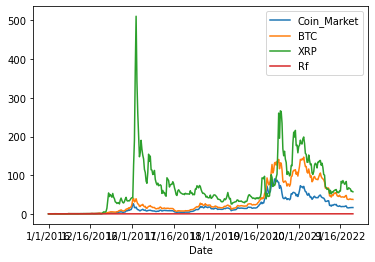

In [389]:
df_cumm_returns[['Coin_Market', 'BTC', 'XRP', 'Rf']].plot()

In [390]:
df_cumm_returns

,Coin_Market,BTC,ETH,XRP,Rf
Date,,,,,
1/1/2016,0.000000,0.000000,0.000000,0.000000,0.000000
1/8/2016,0.045661,0.043506,0.040890,-0.003647,0.000038
1/15/2016,-0.168165,-0.161173,0.274240,-0.121863,0.000083
1/22/2016,-0.128745,-0.119360,0.583578,-0.141168,0.000140
1/29/2016,-0.156278,-0.126308,1.631748,0.148532,0.000202
2/5/2016,-0.141311,-0.110019,1.678192,0.219487,0.000257
2/12/2016,-0.178714,-0.115282,4.851097,0.339941,0.000313
2/19/2016,-0.084217,-0.031195,3.997648,0.384502,0.000371
2/26/2016,-0.067919,-0.005024,5.246329,0.353130,0.000432


In [391]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

In [414]:
fig = px.line(df_cumm_returns, x = df_cumm_returns.index, y = ['Coin_Market', 'XRP'],)
fig.update_layout(plot_bgcolor='rgba(0, 0, 0, 0)',
                                paper_bgcolor='rgba(0, 0, 0, 0)')
fig.show()

In [415]:
fig.write_image(r"D:\EDHEC\Research Thesis\Paper\fig3.png")

In [416]:
trend

,Trends
Date,
12/25/2015,4
12/26/2015,4
12/27/2015,4
12/28/2015,4
12/29/2015,4
...,...
12/27/2022,25
12/28/2022,25
12/29/2022,25


In [417]:
scaler = StandardScaler()
x = np.array(trend['Trends'])

In [419]:
x = x.reshape(-1,1)
a = scaler.fit_transform(x)
trend['Scaled_trend'] = a
df_cumm_returns['Trend'] = trend['Scaled_trend']

In [420]:
df_cumm_returns

,Coin_Market,BTC,ETH,XRP,Rf,Trend
Date,,,,,,
1/1/2016,0.000000,0.000000,0.000000,0.000000,0.000000,-1.061130
1/8/2016,0.045661,0.043506,0.040890,-0.003647,0.000038,-1.061130
1/15/2016,-0.168165,-0.161173,0.274240,-0.121863,0.000083,-1.061130
1/22/2016,-0.128745,-0.119360,0.583578,-0.141168,0.000140,-1.061130
1/29/2016,-0.156278,-0.126308,1.631748,0.148532,0.000202,-1.061130
2/5/2016,-0.141311,-0.110019,1.678192,0.219487,0.000257,-1.061130
2/12/2016,-0.178714,-0.115282,4.851097,0.339941,0.000313,-1.061130
2/19/2016,-0.084217,-0.031195,3.997648,0.384502,0.000371,-1.061130
2/26/2016,-0.067919,-0.005024,5.246329,0.353130,0.000432,-1.061130


In [424]:
fig = px.scatter(df_cumm_returns, x="Trend", y="Coin_Market", trendline="ols")
fig.update_layout(plot_bgcolor='rgba(0, 0, 0, 0)',paper_bgcolor='rgba(0, 0, 0, 0)')
fig.show()

In [425]:
fig.write_image(r"D:\EDHEC\Research Thesis\Paper\fig4.png")

In [426]:
fig = px.scatter(df_cumm_returns, x="Trend", y="BTC", trendline="ols")
fig.update_layout(plot_bgcolor='rgba(0, 0, 0, 0)',paper_bgcolor='rgba(0, 0, 0, 0)')
fig.show()

In [427]:
fig.write_image(r"D:\EDHEC\Research Thesis\Paper\fig5.png")